In [1]:
library(dplyr)
library(Seurat)
library(patchwork)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Attaching SeuratObject



In [2]:
library(ggplot2)
library(cowplot)


Attaching package: ‘cowplot’


The following object is masked from ‘package:patchwork’:

    align_plots




In [3]:
library(plotly)


Attaching package: ‘plotly’


The following object is masked from ‘package:ggplot2’:

    last_plot


The following object is masked from ‘package:stats’:

    filter


The following object is masked from ‘package:graphics’:

    layout




In [4]:

## remove the x-axis text and tick
## plot.margin to adjust the white space between each plot.
## ... pass any arguments to VlnPlot in Seurat
modify_vlnplot<- function(obj, 
                          feature, 
                          pt.size = 0, 
                          plot.margin = unit(c(-0.75, 0, -0.75, 0), "cm"),
                          ...) {
  p<- VlnPlot(obj, features = feature, pt.size = pt.size, ... )  + 
    xlab("") + ylab(feature) + ggtitle("") + 
    theme(legend.position = "none", 
          axis.text.x = element_blank(), 
          axis.ticks.x = element_blank(), 
          axis.title.y = element_text(size = rel(1), angle = 0), 
          axis.text.y = element_text(size = rel(1)), 
          plot.margin = plot.margin ) 
  return(p)
}

## extract the max value of the y axis
extract_max<- function(p){
  ymax<- max(ggplot_build(p)$layout$panel_scales_y[[1]]$range$range)
  return(ceiling(ymax))
}


## main function
StackedVlnPlot<- function(obj, features,
                          pt.size = 0, 
                          plot.margin = unit(c(-0.75, 0, -0.75, 0), "cm"),
                          ...) {
  
  plot_list<- purrr::map(features, function(x) modify_vlnplot(obj = obj,feature = x, ...))
  
  # Add back x-axis title to bottom plot. patchwork is going to support this?
  plot_list[[length(plot_list)]]<- plot_list[[length(plot_list)]] +
    theme(axis.text.x=element_text(), axis.ticks.x = element_line())
  
  # change the y-axis tick to only max value 
  ymaxs<- purrr::map_dbl(plot_list, extract_max)
  plot_list<- purrr::map2(plot_list, ymaxs, function(x,y) x + 
                            scale_y_continuous(breaks = c(y)) + 
                            expand_limits(y = y))

  p<- patchwork::wrap_plots(plotlist = plot_list, ncol = 1)
  return(p)
}

In [5]:
load("0709-pALPC3-plasma.Rda")

In [6]:
pALPC3<-plasma

In [7]:
load("0709-pALPC2-plasma.Rda")

In [8]:
pALPC2<-plasma

In [9]:
load("0709-pALPC1-plasma.Rda")

In [10]:
pALPC1<-plasma

In [11]:
load("0710-normalPC-plasma.Rda")

In [12]:
normalPC<-plasma

In [13]:
load(file="0704-plasmapublic.Rda")

In [14]:
publicPC<-plasma

In [15]:
load("0710-MGUSPC2-plasma.Rda")

In [16]:
MGUSPC2<-plasma

In [17]:
load("0709-MGUSPC1-plasma.Rda")

In [18]:
MGUSPC1<-plasma

In [19]:
pALPC1
pALPC2
pALPC3
MGUSPC1
MGUSPC2
publicPC
normalPC

An object of class Seurat 
15284 features across 3675 samples within 1 assay 
Active assay: RNA (15284 features, 3000 variable features)
 2 dimensional reductions calculated: pca, umap

An object of class Seurat 
16253 features across 1806 samples within 1 assay 
Active assay: RNA (16253 features, 3000 variable features)
 2 dimensional reductions calculated: pca, umap

An object of class Seurat 
15640 features across 4190 samples within 1 assay 
Active assay: RNA (15640 features, 3000 variable features)
 2 dimensional reductions calculated: pca, umap

An object of class Seurat 
15795 features across 1550 samples within 1 assay 
Active assay: RNA (15795 features, 3000 variable features)
 2 dimensional reductions calculated: pca, umap

An object of class Seurat 
12870 features across 1789 samples within 1 assay 
Active assay: RNA (12870 features, 3000 variable features)
 2 dimensional reductions calculated: pca, umap

An object of class Seurat 
20227 features across 717 samples within 1 assay 
Active assay: RNA (20227 features, 3000 variable features)
 3 dimensional reductions calculated: pca, harmony, umap

An object of class Seurat 
15197 features across 354 samples within 1 assay 
Active assay: RNA (15197 features, 3000 variable features)
 2 dimensional reductions calculated: pca, umap

In [20]:
publicPC@meta.data$orig.ident<-"publicPC"

In [21]:
normalPC@meta.data$orig.ident<-"normalPC"

In [22]:
MGUSPC1@meta.data$orig.ident<-"MGUSPC1"

In [23]:
MGUSPC2@meta.data$orig.ident<-"MGUSPC2"

In [24]:
pALPC1@meta.data$orig.ident<-"pALPC1"

In [25]:
pALPC2@meta.data$orig.ident<-"pALPC2"

In [26]:
pALPC3@meta.data$orig.ident<-"pALPC3"

In [27]:
allPC <- merge(MGUSPC1,y=c(MGUSPC2,pALPC1,pALPC2,pALPC3,normalPC,publicPC),project = "MGUSPAL")

Warning message in CheckDuplicateCellNames(object.list = objects):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”


In [28]:
allPC

An object of class Seurat 
21060 features across 14081 samples within 1 assay 
Active assay: RNA (21060 features, 0 variable features)

In [29]:
allPC@meta.data<-allPC@meta.data[,c(1,2,3,4,5)]
allPC@meta.data

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.ig
,<chr>,<dbl>,<int>,<dbl>,<dbl>
AAACCTGAGATGCGAC-1_1,MGUSPC1,8715,930,1.19334481,72.03672
AAACCTGAGGGTATCG-1_1,MGUSPC1,18304,1885,0.60096154,65.82714
AAACCTGAGTCTTGCA-1_1,MGUSPC1,7295,527,0.23303633,82.74160
AAACGGGAGGTGCACA-1_1,MGUSPC1,11203,821,0.01785236,77.72025
AAACGGGGTAAGGATT-1_1,MGUSPC1,10129,693,0.99713693,81.25185
AAACGGGGTGCAGTAG-1_1,MGUSPC1,17218,1509,1.07445696,75.76374
AAACGGGTCCAGATCA-1_1,MGUSPC1,1795,227,1.05849582,82.11699
AAACGGGTCTAACGGT-1_1,MGUSPC1,18929,1787,0.62338211,70.29954
AAAGATGCATGAGCGA-1_1,MGUSPC1,4388,511,0.11394713,77.05105


In [30]:
all.genes <- rownames(allPC)
#RPL,RPS,MT- should be discarded
length(all.genes)

[1] 21060

In [31]:
library(stringr)
MT<-grep('MT-', all.genes, value = T)
RPL<-grep('RPL', all.genes, value = T)
RPS<-grep('RPS', all.genes, value = T)
MT
RPL
RPS

[1] "MT-ND1"  "MT-ND2"  "MT-CO1"  "MT-CO2"  "MT-ATP8" "MT-ATP6" "MT-CO3" 
 [8] "MT-ND3"  "MT-ND4L" "MT-ND4"  "MT-ND5"  "MT-ND6"  "MT-CYB"

[1] "MRPL20"         "RPL22"          "RPL11"          "MRPL37"        
  [5] "RPL5"           "MRPL9"          "MRPL24"         "MRPL55"        
  [9] "MRPL33"         "MRPL53"         "MRPL19"         "MRPL35"        
 [13] "MRPL30"         "RPL31"          "RPL37A"         "MRPL44"        
 [17] "RPL32"          "RPL15"          "RPL14"          "RPL29"         
 [21] "RPL24"          "MRPL3"          "RPL22L1"        "MRPL47"        
 [25] "RPL39L"         "RPL35A"         "RPL9"           "MRPL1"         
 [29] "RPL34-AS1"      "RPL34"          "MRPL36"         "RPL37"         
 [33] "MRPL22"         "RPL26L1"        "RPL10A"         "RPL7L1"        
 [37] "MRPL2"          "MRPL14"         "MRPL18"         "MRPL32"        
 [41] "RPL36A"         "RPL39"          "RPL10"          "MRPL15"        
 [45] "RPL7"           "RPL30"          "MRPL13"         "RPL8"          
 [49] "MRPL50"         "RPL35"          "RPL12"          "RPL7A"         
 [53] "MRPL41"         "RPLP2"          "MRPL23"         "MRPL17"        
 [57] "RPL27A"         "MRPL16"         "MRPL49"         "MRPL11"        
 [61] "MRPL21"         "MRPL48"         "MRPL43"         "MRPL51"        
 [65] "RPL41"          "MRPL42"         "RPL6"           "RPLP0"         
 [69] "MRPL57"         "RPL21"          "MRPL52"         "RPL36AL"       
 [73] "RPL4"           "RPLP1"          "MRPL46"         "MRPL28"        
 [77] "RPL3L"          "RPL13"          "RPL26"          "RPL23A"        
 [81] "MRPL45"         "RPL23"          "RPL19"          "RPL27"         
 [85] "MRPL10"         "MRPL27"         "RPL38"          "MRPL38"        
 [89] "MRPL12"         "RPL17-C18orf32" "RPL17"          "MRPL54"        
 [93] "RPL36"          "MRPL4"          "MRPL34"         "RPL18A"        
 [97] "RPL18"          "RPL13A"         "RPL28"          "MRPL40"        
[101] "RPL3"           "MRPL39"         "RPL10L"         "RPL36A-HNRNPH2"

[1] "RPS6KA1"     "MRPS15"      "RPS8"        "MRPS21"      "RPS27"      
 [6] "MRPS14"      "RPS6KC1"     "RPS7"        "RPS27A"      "MRPS5"      
[11] "MRPS9"       "MRPS25"      "RPSA"        "MRPS22"      "MRPS18C"    
[16] "RPS3A"       "MRPS30"      "MRPS36"      "MRPS27"      "RPS23"      
[21] "RPS14"       "MRPS18B"     "RPS18"       "RPS10"       "MRPS10"     
[26] "MRPS18A"     "RPS12"       "RPS6KA2"     "MRPS24"      "MRPS17"     
[31] "MRPS33"      "PRPS2"       "RPS6KA3"     "RPS4X"       "PRPS1"      
[36] "RPS20"       "MRPS28"      "TRPS1"       "RPS6"        "MRPS2"      
[41] "RPS13"       "RPS6KA4"     "RPS6KB2"     "RPS3"        "RPS25"      
[46] "MRPS16"      "RPS24"       "MRPS35"      "RPS26"       "MRPS31"     
[51] "RPS29"       "RPS6KL1"     "RPS6KA5"     "RPS27L"      "RPS17"      
[56] "MRPS11"      "MRPS34"      "RPS2"        "RPS15A"      "PRPSAP2"    
[61] "MRPS23"      "RPS6KB1"     "MRPS7"       "PRPSAP1"     "MRPS26"     
[66] "RPS21"       "RPS15"       "RPS28"       "MRPS12"      "RPS16"      
[71] "RPS19"       "RPS11"       "RPS9"        "RPS5"        "RPS4Y1"     
[76] "RPS19BP1"    "MRPS6"       "RPS6KA6"     "RPS10-NUDT3" "RPS4Y2"

In [32]:
RPS<-setdiff(RPS,c("TRPS1","PRPSAP2","PRPSAP1","PRPS2","PRPS1"))

In [33]:
all.genes<-setdiff(all.genes,RPS)
all.genes<-setdiff(all.genes,MT)
all.genes<-setdiff(all.genes,RPL)
length(all.genes)

[1] 20868

In [34]:
allPC<-allPC[all.genes,]

In [35]:
allPC2 <- NormalizeData(allPC, verbose=FALSE)

When using repel, set xnudge and ynudge to 0 for optimal results

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 2632 rows containing missing values (geom_point).”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 2632 rows containing missing values (geom_point).”


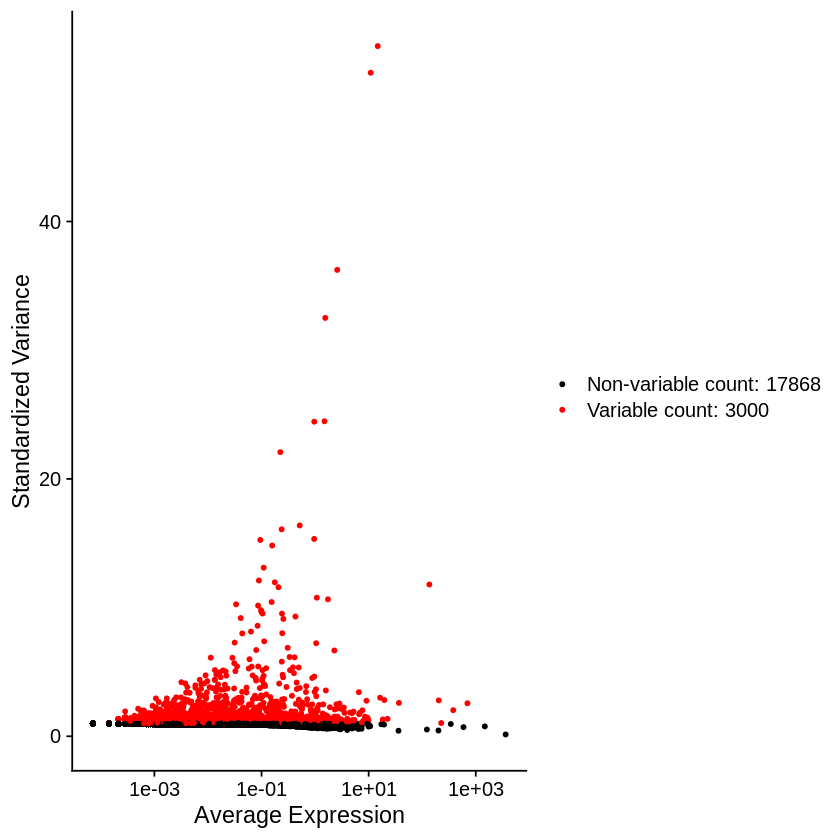

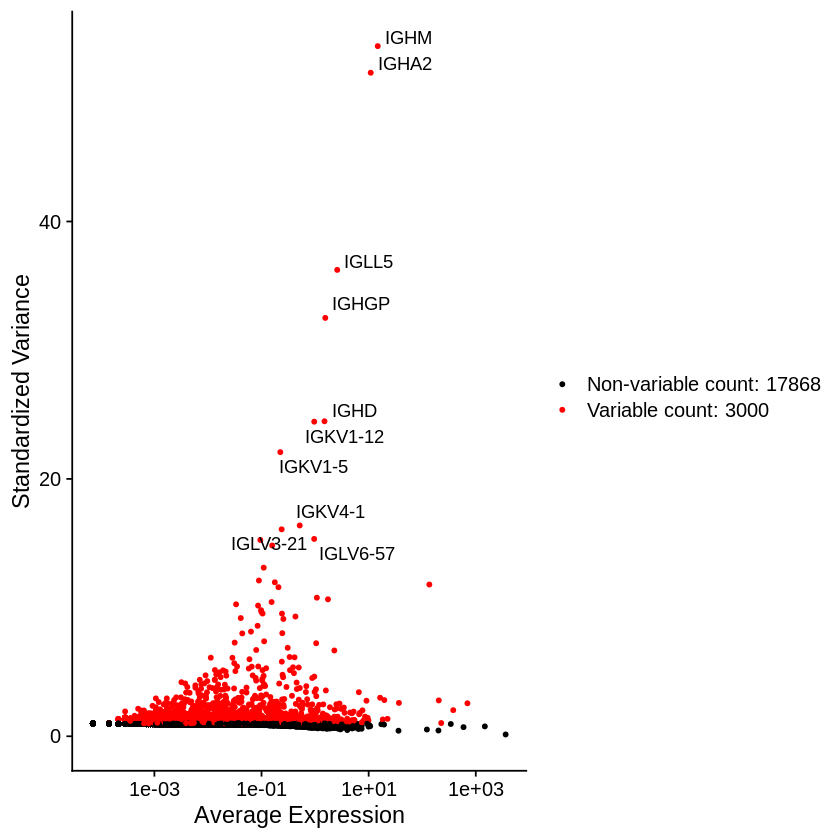

In [36]:
allPC2 <- FindVariableFeatures(allPC2, selection.method = "vst", nfeatures = 3000)

# Identify the 10 most highly variable genes
top10 <- head(VariableFeatures(allPC2), 10)

# plot variable features with and without labels
plot1 <- VariableFeaturePlot(allPC2)
plot2 <- LabelPoints(plot = plot1, points = top10, repel = TRUE)
plot1
plot2

In [37]:
allPC3 <- ScaleData(allPC2, features = all.genes,verbose=FALSE)

In [38]:
allPC3 <- RunPCA(allPC3, features = VariableFeatures(object = allPC3))

PC_ 1 
Positive:  IGLV2-23, JCHAIN, IGLV3-19, VPREB3, CCND1, TIMP1, RP5-887A10.1, FRZB, IGHV4-34, CADM1 
	   DKK1, IGHG3, IGHG2, IGLV2-14, CTSW, IGHV3-23, PLD4, LPAR6, IGHV4-31, IFI6 
	   IGHV1-24, MDK, RP11-525A16.4, DPEP3, S100A1, SYNGR1, CD79A, EFNA5, JSRP1, PTPRS 
Negative:  EEF1A1, IGLV1-44, IGHE, VIM, GNB2L1, TUBB2B, SEC11C, HNRNPA1, EEF2, GAS6 
	   QPCT, HINT1, HSP90B1, EEF1B2, UBA52, BTF3, CD48, ITM2C, TPT1, HIGD2A 
	   GLTSCR2, NACA, PPIA, UQCRB, TOMM7, UQCRH, PTP4A3, GAPDH, SLC25A6, LMAN2 
PC_ 2 
Positive:  JCHAIN, TMSB4X, CCND1, FRZB, RP5-887A10.1, TMSB10, CD79A, CD52, CD99, DUSP1 
	   PPDPF, BTG1, ZFP36L2, ARHGDIB, HBA2, HLA-DRB1, TRAF3IP3, CD44, PTPRC, PMAIP1 
	   LIMD2, ITGB7, COTL1, LSP1, EAF2, LY6E, LTB, ANXA2, TRBC2, HBD 
Negative:  RP11-598F7.3, IGHG2, PTP4A3, DHRS9, ZFP36L1, IGLV3-19, QPCT, IGHV3-23, IGHE, IGLV1-44 
	   KCNS3, C1orf21, GAS6, TUBB2B, S100A1, DNAAF1, ITM2C, CCDC144A, CD46, MOCOS 
	   CCND2, RHOB, PHACTR3, CLDN14, IGHV1-24, PTPRZ1, MIR4458HG, SOCS3, CD9

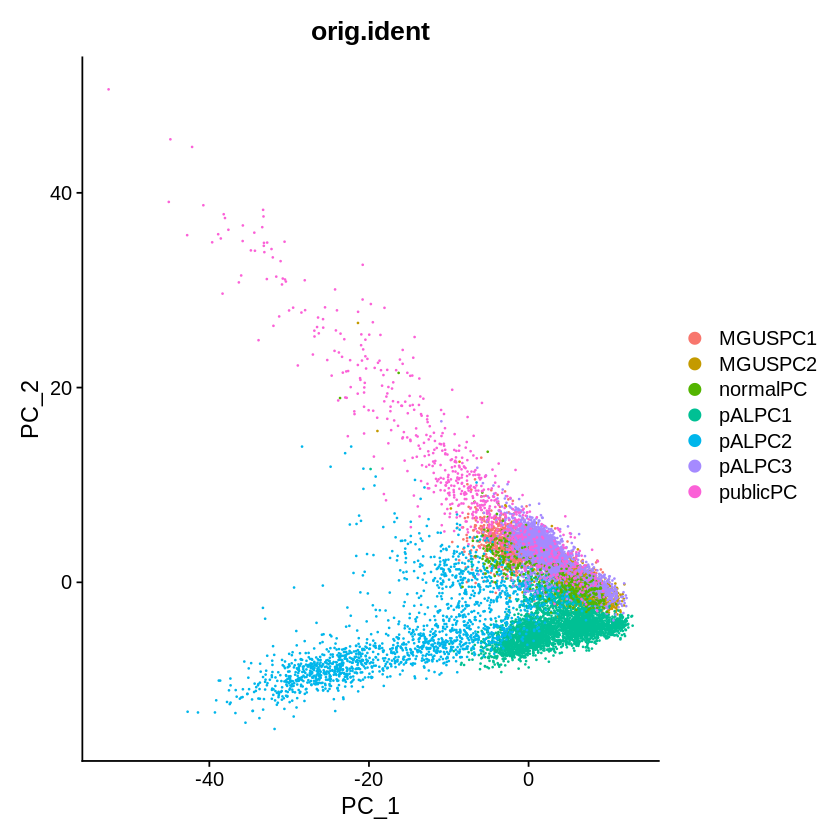

In [39]:
DimPlot(allPC3, reduction = "pca",group.by="orig.ident")

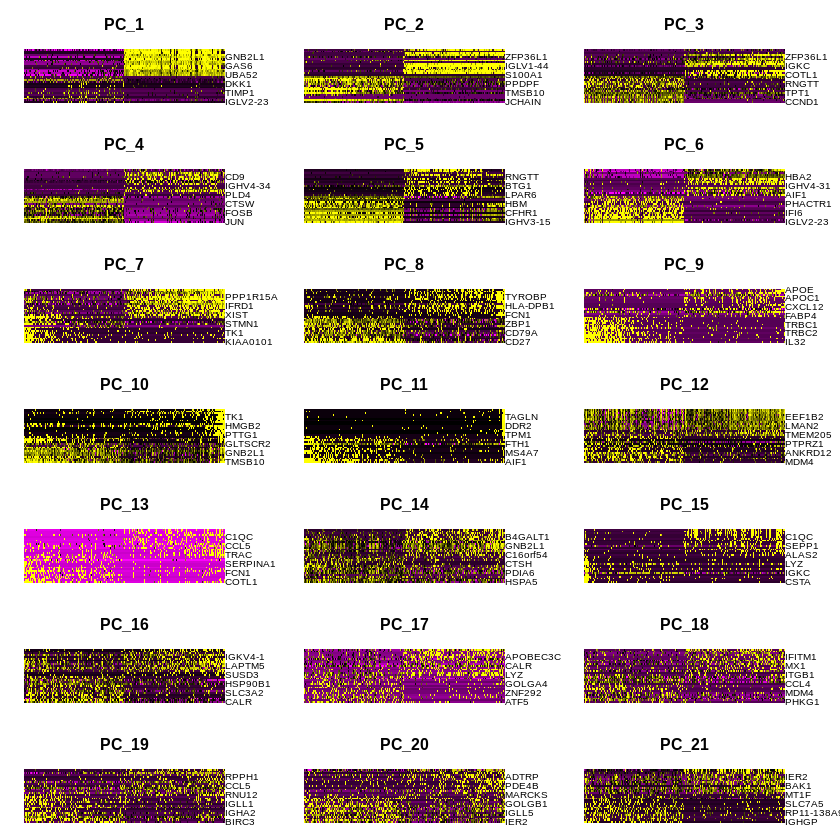

In [40]:
DimHeatmap(allPC3, dims = 1:21, cells = 500, balanced = TRUE)

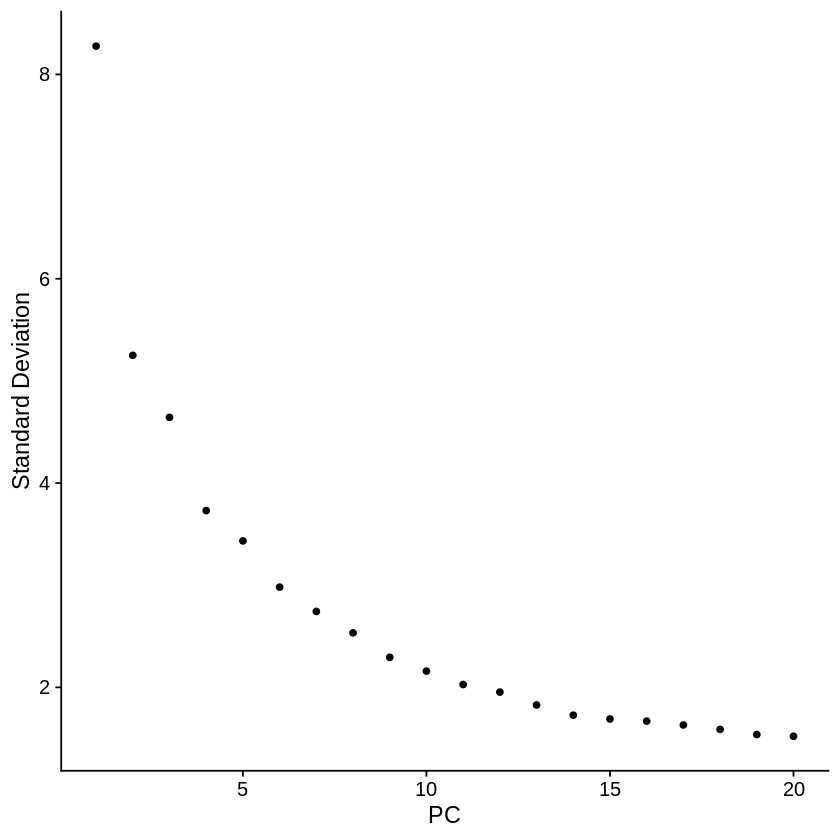

In [41]:
ElbowPlot(allPC3)

In [42]:
allPC3 <- FindNeighbors(allPC3, dims = 1:12)
allPC3 <- FindClusters(allPC3, resolution = c(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1))

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 14081
Number of edges: 507007

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9782
Number of communities: 8
Elapsed time: 1 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 14081
Number of edges: 507007

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9657
Number of communities: 9
Elapsed time: 1 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 14081
Number of edges: 507007

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9539
Number of communities: 13
Elapsed time: 1 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 14081
Number of edges: 507007

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9443
Number of communities: 14
Elapsed time: 1 seconds
Modularity Opt

In [43]:
allPC3 <- RunUMAP(allPC3, dims = 1:12)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
08:16:02 UMAP embedding parameters a = 0.9922 b = 1.112

08:16:02 Read 14081 rows and found 12 numeric columns

08:16:02 Using Annoy for neighbor search, n_neighbors = 30

08:16:02 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

08:16:03 Writing NN index file to temp file /tmp/RtmpnHRVXH/file14e5fd78aa3e94

08:16:03 Searching Annoy index using 1 thread, search_k = 3000

08:16:06 Annoy recall = 100%

08:16:06 Commencing smooth kNN distance calibration using 1 thread

08:16:07 Initializing 

In [115]:
av<-AverageExpression (allPC3,group.by='orig.ident',assay='RNA')
av=av[[1]]
head(av)
av<-av[,c(4,5,6)]
cg=names(tail(sort(apply(av,1,sd)),1000))

,MGUSPC1,MGUSPC2,normalPC,pALPC1,pALPC2,pALPC3,publicPC
RP11-34P13.7,0.001808810,0.000000000,0.00000000,0.001002770,0.001972431,0.0002136265,0.002211365
FO538757.2,0.022797859,0.037225370,0.01579585,0.037164623,0.054446136,0.0234976374,0.077826850
AP006222.2,0.017790528,0.023248468,0.01322807,0.016164922,0.028585210,0.0137298168,0.058208850
RP11-206L10.9,0.025845893,0.025794007,0.01553605,0.016166149,0.034659458,0.0318766228,0.038669359
LINC00115,0.005317940,0.003413622,0.00000000,0.001583261,0.006082922,0.0064049307,0.008827649
FAM41C,0.001452873,0.016951136,0.00273545,0.001267453,0.009224208,0.0022677850,0.021994693


In [116]:
av<-as.data.frame(av[cg,])
M=cor(av,method='spearman')

In [117]:
options(repr.plot.height=6,repr.plot.width=7)

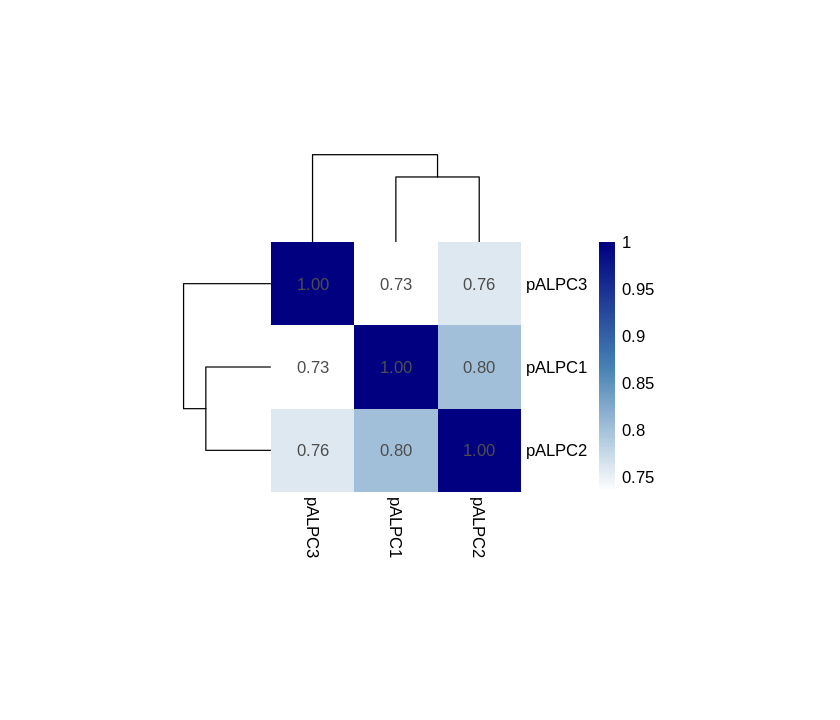

In [118]:
library(pheatmap)
library(ggplot2)
p<-pheatmap(M,display_numbers = TRUE,fontsize_number=10,cluster_col=T,cluster_row=T,color = colorRampPalette(c("white",'steelblue',"navy"))(100),border=F,cellwidth=50,cellheight=50)

In [119]:
save_pheatmap_pdf <- function(x, filename, width=10, height=10) {
   stopifnot(!missing(x))
   stopifnot(!missing(filename))
   pdf(filename, width=width, height=height)
   grid::grid.newpage()
   grid::grid.draw(x$gtable)
   dev.off()
}

In [120]:
save_pheatmap_pdf(p, "0717-heatmap.pdf")

png 
  2

In [44]:
options(repr.plot.height=8,repr.plot.width=8)

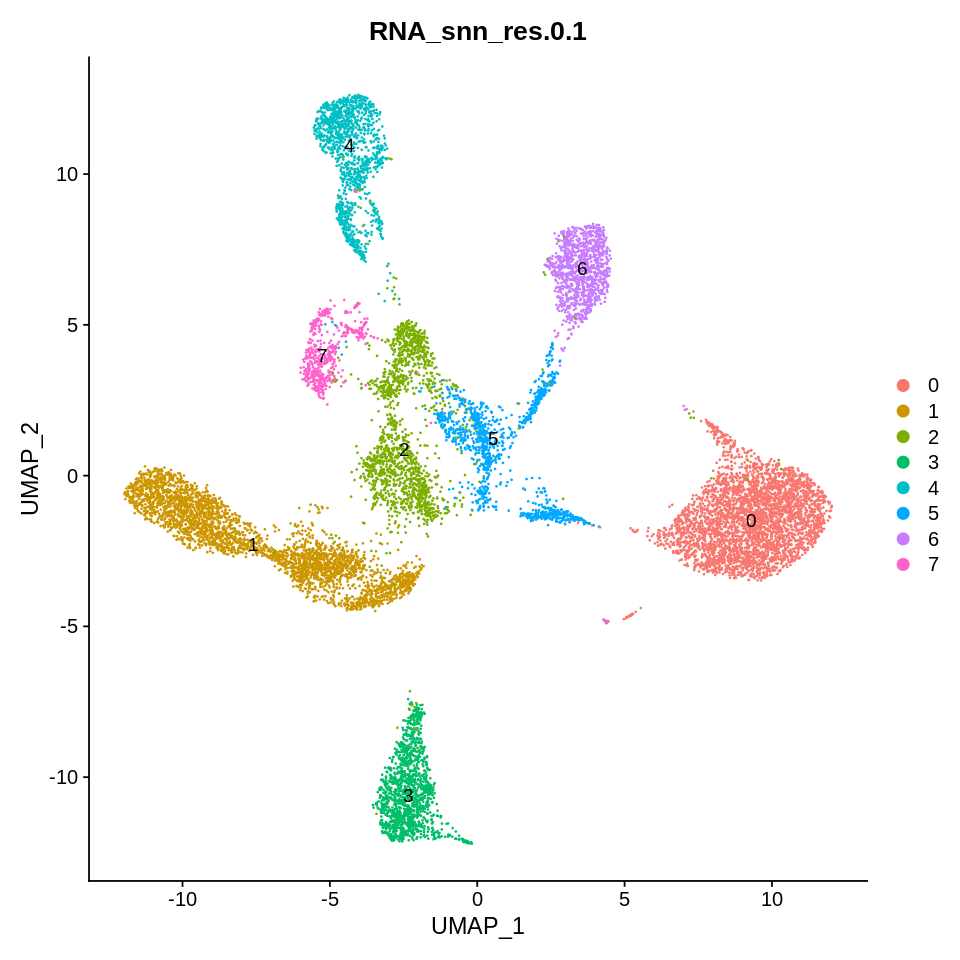

In [45]:
DimPlot(allPC3, reduction = "umap",group.by="RNA_snn_res.0.1",label=T)

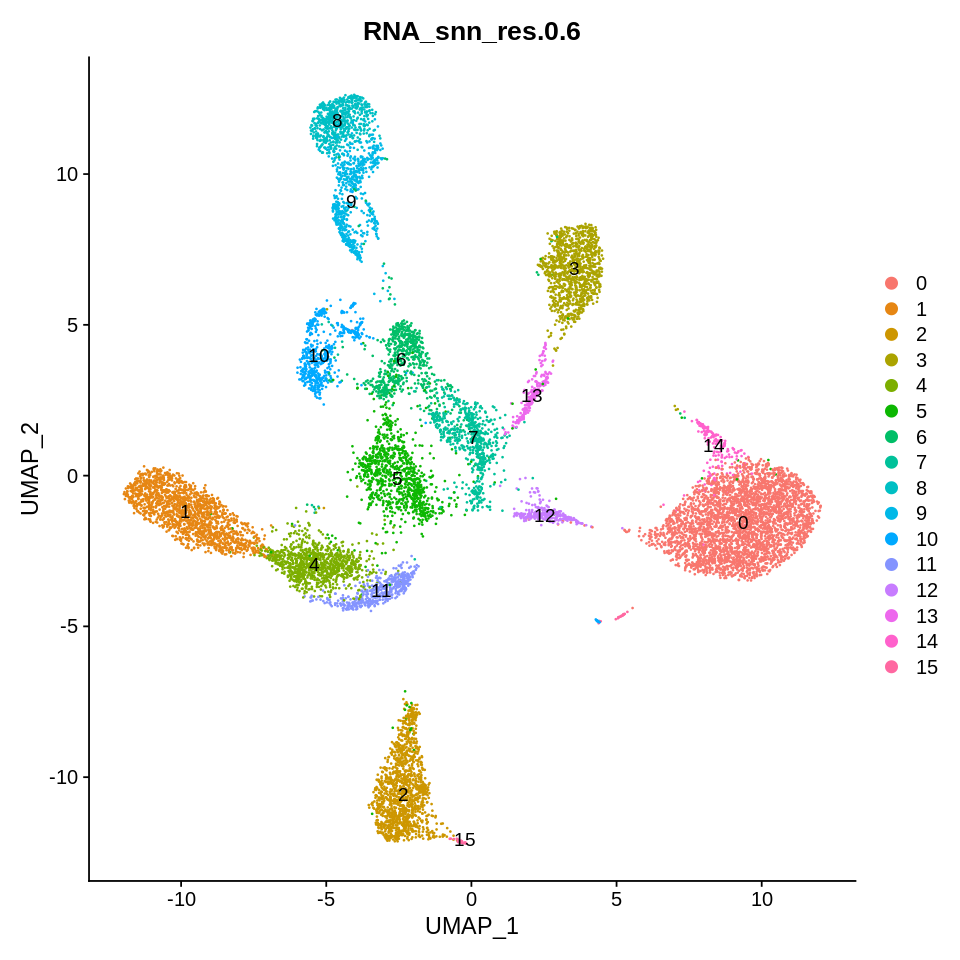

In [46]:
DimPlot(allPC3, reduction = "umap",group.by="RNA_snn_res.0.6",label=T)

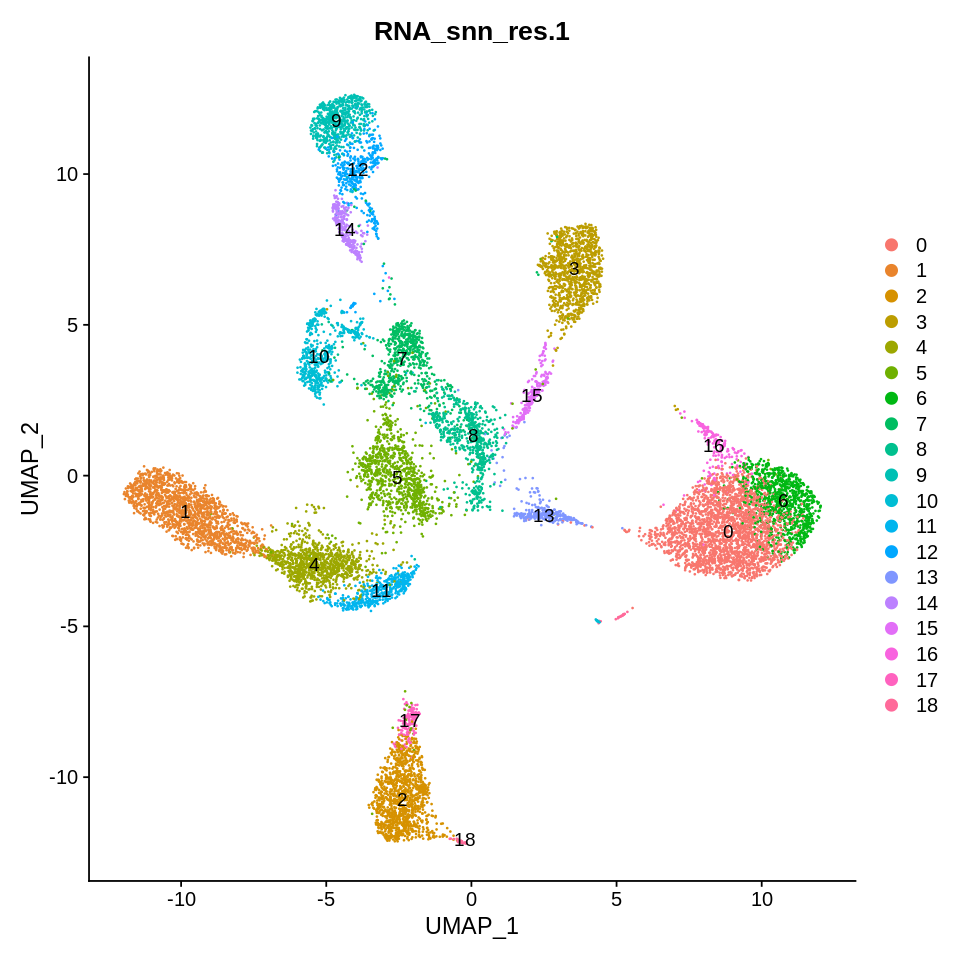

In [47]:
DimPlot(allPC3, reduction = "umap",group.by="RNA_snn_res.1",label=T)

In [48]:
options(repr.plot.height=8,repr.plot.width=9)

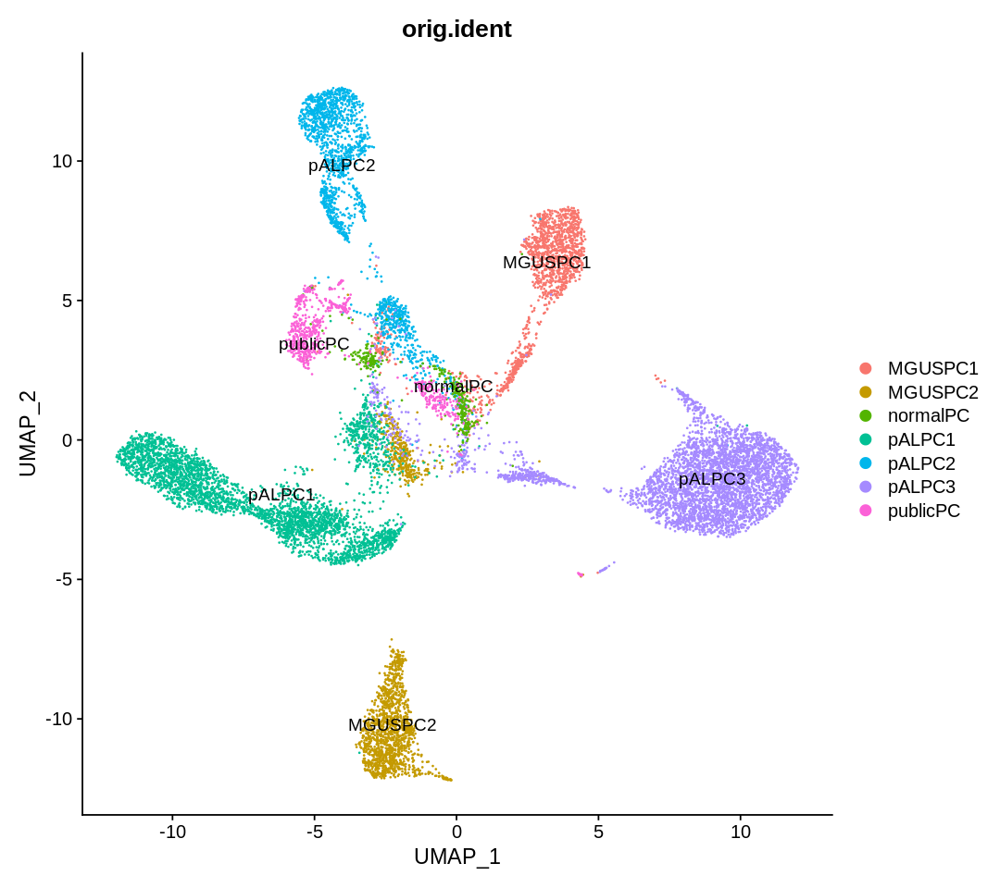

In [49]:
DimPlot(allPC3, reduction = "umap",group.by="orig.ident",label=T)

In [50]:
options(repr.plot.height=4,repr.plot.width=20)

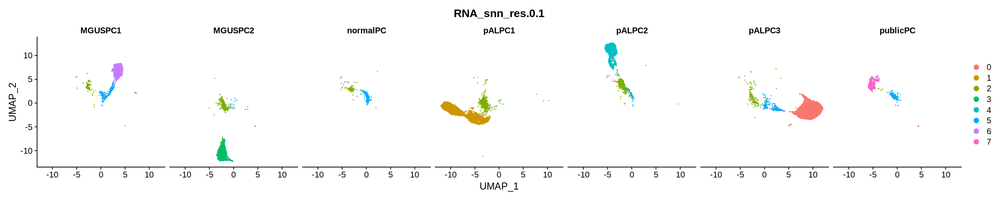

In [51]:
DimPlot(allPC3, reduction = "umap",split.by="orig.ident",group.by="RNA_snn_res.0.1")

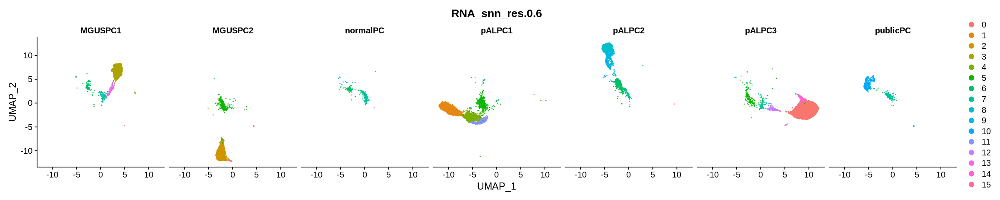

In [52]:
DimPlot(allPC3, reduction = "umap",split.by="orig.ident",group.by="RNA_snn_res.0.6")

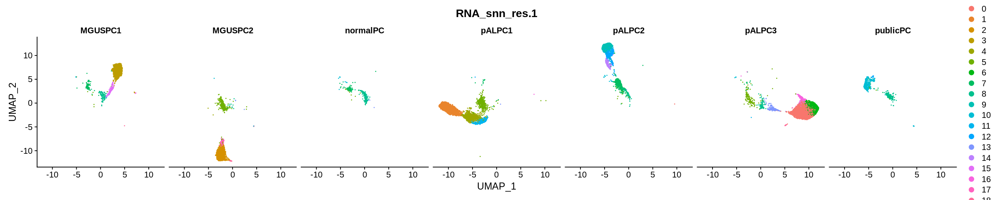

In [53]:
DimPlot(allPC3, reduction = "umap",split.by="orig.ident",group.by="RNA_snn_res.1")

In [54]:
allPC3 <- FindNeighbors(allPC3, dims = 1:12)
allPC3 <- FindClusters(allPC3, resolution = 0.6)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 14081
Number of edges: 507007

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9255
Number of communities: 16
Elapsed time: 1 seconds


In [55]:
merge.markers <- FindAllMarkers(allPC3, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25)
merge.markers %>% group_by(cluster) %>% top_n(n = 15, wt = avg_log2FC)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15



p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0.000000e+00,2.4446867,1.000,0.960,0.000000e+00,0,IGHG4
0.000000e+00,2.3547958,1.000,0.742,0.000000e+00,0,JCHAIN
0.000000e+00,1.5832725,0.982,0.277,0.000000e+00,0,CCND1
0.000000e+00,1.4726127,0.968,0.279,0.000000e+00,0,RP5-887A10.1
0.000000e+00,1.4636441,0.955,0.255,0.000000e+00,0,FRZB
0.000000e+00,1.2764635,0.688,0.134,0.000000e+00,0,LINC01480
0.000000e+00,1.1759013,0.965,0.560,0.000000e+00,0,DUSP1
0.000000e+00,1.1189390,0.610,0.047,0.000000e+00,0,PMAIP1
0.000000e+00,1.0836083,0.957,0.531,0.000000e+00,0,COMMD3


In [56]:
options(repr.plot.height=10,repr.plot.width=10)

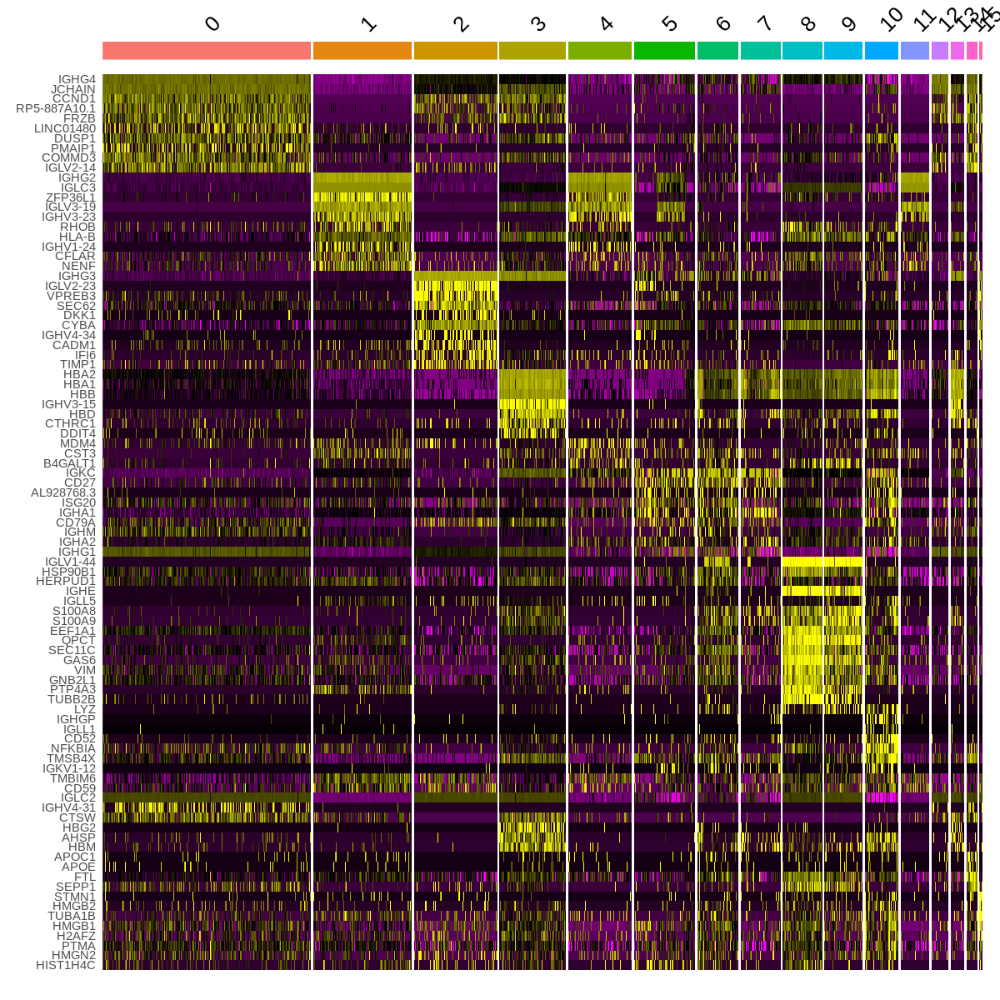

In [57]:
top10 <- merge.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_log2FC)
DoHeatmap(allPC3, features = top10$gene) + NoLegend()

In [58]:
options(repr.plot.height=5,repr.plot.width=8)


Attaching package: ‘ggpubr’


The following object is masked from ‘package:cowplot’:

    get_legend




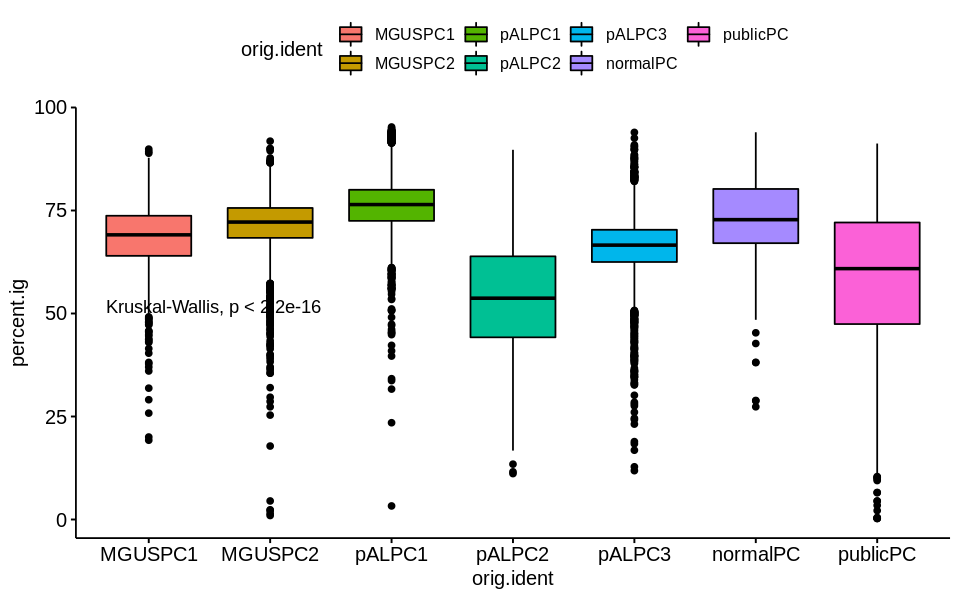

In [59]:
library(ggpubr)
library(RColorBrewer)
ggboxplot(allPC3@meta.data, x="orig.ident", y="percent.ig", fill ="orig.ident")+
  stat_compare_means(label.y = 50)

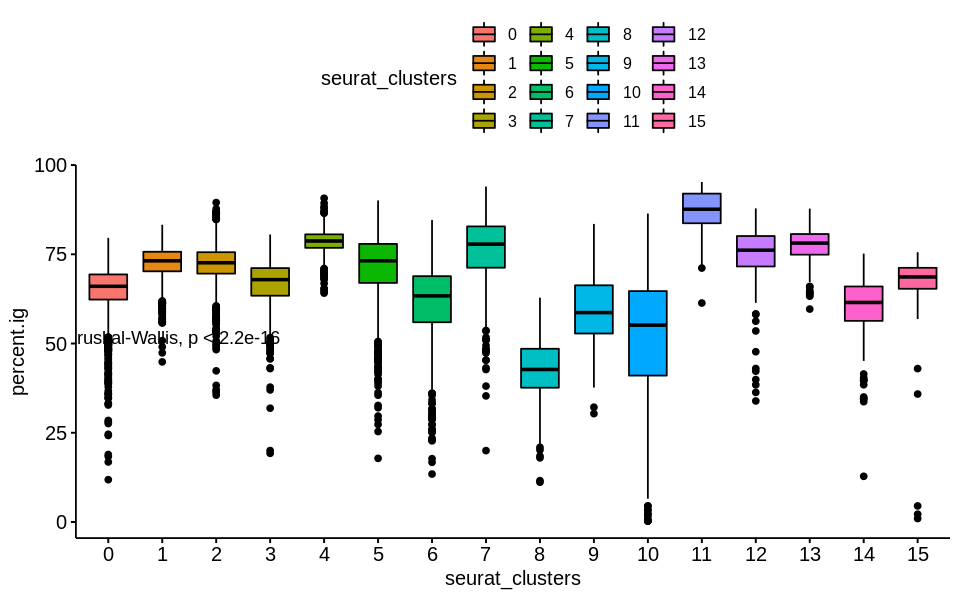

In [60]:
library(ggpubr)
library(RColorBrewer)
ggboxplot(allPC3@meta.data, x="seurat_clusters", y="percent.ig", fill ="seurat_clusters")+
  stat_compare_means(label.y = 50)

In [61]:
options(repr.plot.height=8,repr.plot.width=8)

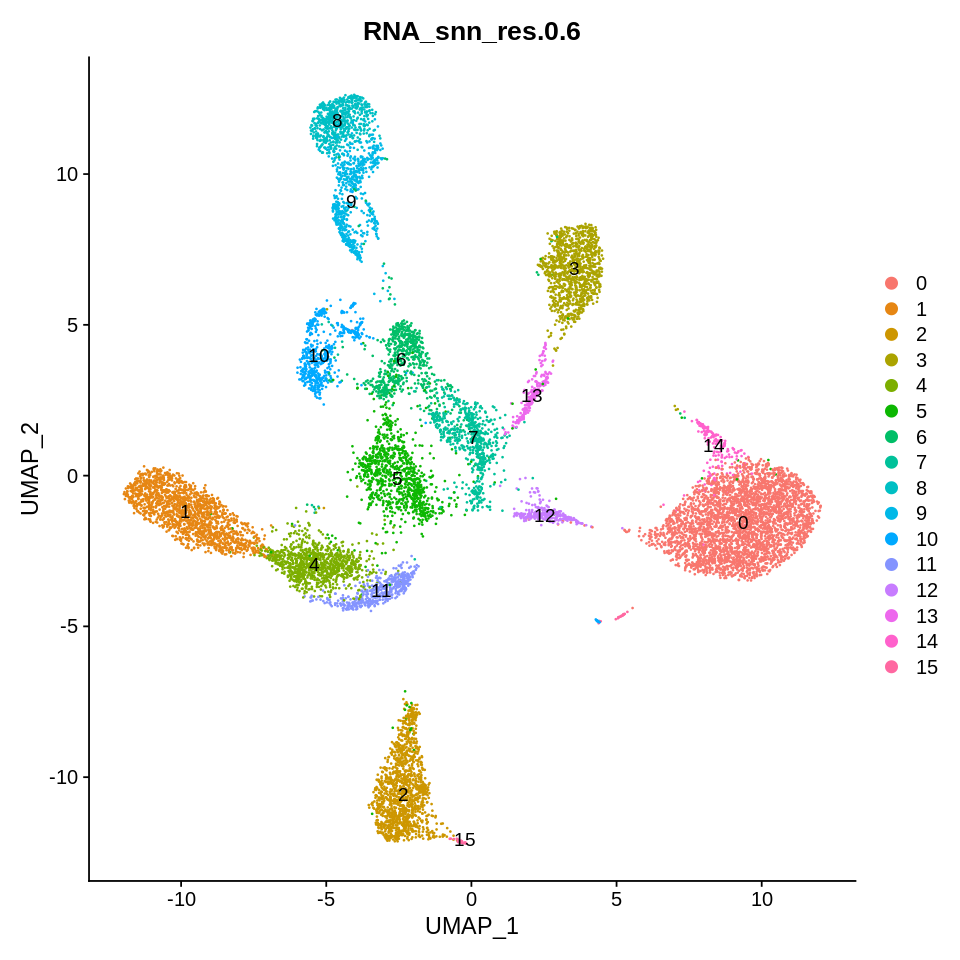

In [62]:
DimPlot(allPC3, reduction = "umap",group.by="RNA_snn_res.0.6",label=T)

In [63]:
ggsave("fig.s3.2.pdf",height=8,width=8)
dev.off()

null device 
          1

In [64]:
options(repr.plot.height=8,repr.plot.width=9)

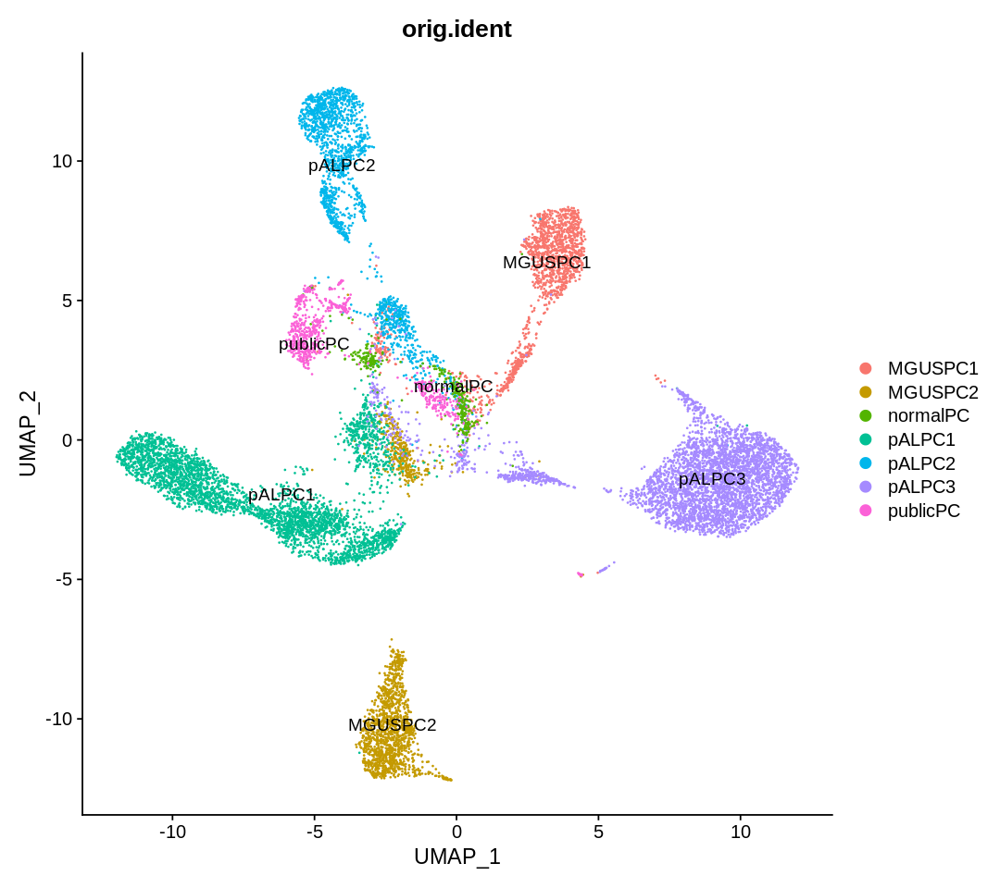

In [65]:
DimPlot(allPC3, reduction = "umap",group.by="orig.ident",label=T)

In [66]:
ggsave("fig.3.1.pdf",height=8,width=9)
dev.off()

null device 
          1

In [67]:
all.genes2 <- rownames(allPC3)
length(all.genes2)

[1] 20868

In [68]:
library(stringr)
IG<-grep('IG', all.genes2, value = T)
IG

[1] "IGSF21"       "PIGV"         "PIGK"         "AMIGO1"       "TMIGD3"      
  [6] "LRIG2"        "VSIG8"        "PIGM"         "IGSF8"        "PIGC"        
 [11] "PIGF"         "IGKC"         "IGKV1-12"     "IGKV4-1"      "IGKV1-5"     
 [16] "IGKV1-6"      "IGKV1-9"      "IGKV3-11"     "IGKV3-15"     "IGKV1-16"    
 [21] "IGKV1-17"     "IGKV3-20"     "IGKV2-24"     "IGKV1-27"     "IGKV2-30"    
 [26] "IGKV1-39"     "IGKV1D-39"    "IGKV1D-33"    "IGKV2D-28"    "IGKV3D-20"   
 [31] "IGKV1D-17"    "IGKV1D-13"    "IGKV1OR2-108" "INSIG2"       "FIGN"        
 [36] "PPIG"         "IGFBP2"       "IGFBP5"       "TIGD1"        "GIGYF2"      
 [41] "HIGD1A"       "AMIGO3"       "LRIG1"        "TIGIT"        "IGF2BP2"     
 [46] "PIGX"         "PIGZ"         "PIGG"         "IGFBP7"       "TIGD2"       
 [51] "IGIP"         "TIGD6"        "HIGD2A"       "FIG4"         "AIG1"        
 [56] "IGF2R"        "IGF2BP3"      "IGFBP3"       "FIGNL1"       "PVRIG"       
 [61] "GIGYF1"       "INSIG1"       "PIGA"         "VSIG4"        "IGBP1"       
 [66] "VSIG1"        "IGSF1"        "TIGD5"        "IGHEP2"       "SIGMAR1"     
 [71] "PIGO"         "SIGIRR"       "IGF2"         "IGSF22"       "TIGD3"       
 [76] "IGHMBP2"      "MEIG1"        "TIGAR"        "AMIGO2"       "IGFBP6"      
 [81] "LRIG3"        "IGF1"         "VSIG10"       "LIG4"         "PIGH"        
 [86] "IGHA2"        "IGHE"         "IGHG4"        "IGHG2"        "IGHGP"       
 [91] "IGHA1"        "IGHG1"        "IGHG3"        "IGHD"         "IGHM"        
 [96] "IGHV6-1"      "IGHV1-2"      "IGHV1-3"      "IGHV4-4"      "IGHV2-5"     
[101] "IGHV3-7"      "IGHV3-11"     "IGHV3-13"     "IGHV3-15"     "IGHV1-18"    
[106] "IGHV3-21"     "IGHV3-23"     "IGHV1-24"     "IGHV4-28"     "IGHV3-30"    
[111] "IGHV4-31"     "IGHV3-33"     "IGHV4-34"     "IGHV4-39"     "IGHV3-43"    
[116] "IGHV1-46"     "IGHV3-48"     "IGHV3-49"     "IGHV5-51"     "IGHV3-53"    
[121] "IGHV4-59"     "IGHV4-61"     "IGHV3-64"     "IGHV3-66"     "IGHV1-69"    
[126] "IGHV1-69-2"   "IGHV3-72"     "IGHV3-73"     "IGHV3-74"     "PIGBOS1"     
[131] "PIGB"         "IGF1R"        "PIGQ"         "TIGD7"        "IGSF6"       
[136] "PIGL"         "PIGS"         "LIG3"         "PIGW"         "IGFBP4"      
[141] "PIGN"         "SIGLEC1"      "PIGU"         "PKIG"         "PIGT"        
[146] "TMIGD2"       "IGFLR1"       "LIG1"         "SIGLEC11"     "SIGLEC9"     
[151] "SIGLEC7"      "SIGLEC10"     "SIGLEC5"      "IGLVI-70"     "IGLV4-69"    
[156] "IGLV6-57"     "IGLV1-51"     "IGLV9-49"     "IGLV5-48"     "IGLV1-47"    
[161] "IGLV7-46"     "IGLV5-45"     "IGLV1-44"     "IGLV7-43"     "IGLV1-40"    
[166] "IGLV3-27"     "IGLV3-25"     "IGLV2-23"     "IGLV3-21"     "IGLV3-19"    
[171] "IGLV2-18"     "IGLV2-14"     "IGLV2-11"     "IGLV3-10"     "IGLV3-9"     
[176] "IGLV2-8"      "IGLV3-1"      "IGLL5"        "IGLC2"        "IGLC3"       
[181] "IGLC4"        "IGLC5"        "IGLC6"        "IGLC7"        "IGLL1"       
[186] "OLIG1"        "PIGP"         "IGKV1-8"      "IGKV2-29"     "IGKV2D-29"   
[191] "IGSF10"       "TIGD4"        "SIGLEC14"     "IGLV8-61"     "IGLV2-33"    
[196] "IGKV6-21"     "IGKV1-37"     "IGKV2D-30"    "IGKV1D-16"    "IGKV3D-11"   
[201] "IGKV1D-8"     "IGSF11"       "FIGF"         "IGHV3-20"     "IGHV2-26"    
[206] "IGDCC4"       "VSIG10L"      "IGLV4-60"     "IGLV10-54"    "IGLV5-37"    
[211] "IGLV1-36"     "IGLV3-16"     "IGKV6D-21"    "IGKV3D-15"    "IGKV1D-12"   
[216] "IGKV1D-43"    "IGHEP1"       "IGHV1-58"     "IGHV2-70"     "IGHV2-70.1"  
[221] "IGHV3-71"     "IGFALS"       "IGLV11-55"    "IGLV5-52"     "IGLV1-50"    
[226] "IGHV3-32"     "IGLV3-24"     "IGSF3"        "SIGLEC15"     "SIGLEC12"    
[231] "PIGR"         "IGKV2-28"     "VSIG2"        "ARHGDIG"      "HIGD1B"      
[236] "SIGLEC6"      "IGSF9"        "IGFBP7-AS1"   "HIGD2B"       "IGF2BP1"     
[241] "IGLON5"       "IGHV5-78"     "IGLV1-41"     "IGLV4-3"      "IGKV5-2"     
[246] "IGHV4-55"     "IGSF9B"    

In [69]:
IGL<-grep('IGL', all.genes2, value = T)
IGL

[1] "PIGL"      "SIGLEC1"   "SIGLEC11"  "SIGLEC9"   "SIGLEC7"   "SIGLEC10" 
 [7] "SIGLEC5"   "IGLVI-70"  "IGLV4-69"  "IGLV6-57"  "IGLV1-51"  "IGLV9-49" 
[13] "IGLV5-48"  "IGLV1-47"  "IGLV7-46"  "IGLV5-45"  "IGLV1-44"  "IGLV7-43" 
[19] "IGLV1-40"  "IGLV3-27"  "IGLV3-25"  "IGLV2-23"  "IGLV3-21"  "IGLV3-19" 
[25] "IGLV2-18"  "IGLV2-14"  "IGLV2-11"  "IGLV3-10"  "IGLV3-9"   "IGLV2-8"  
[31] "IGLV3-1"   "IGLL5"     "IGLC2"     "IGLC3"     "IGLC4"     "IGLC5"    
[37] "IGLC6"     "IGLC7"     "IGLL1"     "SIGLEC14"  "IGLV8-61"  "IGLV2-33" 
[43] "IGLV4-60"  "IGLV10-54" "IGLV5-37"  "IGLV1-36"  "IGLV3-16"  "IGLV11-55"
[49] "IGLV5-52"  "IGLV1-50"  "IGLV3-24"  "SIGLEC15"  "SIGLEC12"  "SIGLEC6"  
[55] "IGLON5"    "IGLV1-41"  "IGLV4-3"   "IGLJ3"

In [70]:
IGH<-grep('IGH', all.genes2, value = T)
IGH

[1] "IGHEP2"     "IGHMBP2"    "PIGH"       "IGHA2"      "IGHE"      
 [6] "IGHG4"      "IGHG2"      "IGHGP"      "IGHA1"      "IGHG1"     
[11] "IGHG3"      "IGHD"       "IGHM"       "IGHV6-1"    "IGHV1-2"   
[16] "IGHV1-3"    "IGHV4-4"    "IGHV2-5"    "IGHV3-7"    "IGHV3-11"  
[21] "IGHV3-13"   "IGHV3-15"   "IGHV1-18"   "IGHV3-21"   "IGHV3-23"  
[26] "IGHV1-24"   "IGHV4-28"   "IGHV3-30"   "IGHV4-31"   "IGHV3-33"  
[31] "IGHV4-34"   "IGHV4-39"   "IGHV3-43"   "IGHV1-46"   "IGHV3-48"  
[36] "IGHV3-49"   "IGHV5-51"   "IGHV3-53"   "IGHV4-59"   "IGHV4-61"  
[41] "IGHV3-64"   "IGHV3-66"   "IGHV1-69"   "IGHV1-69-2" "IGHV3-72"  
[46] "IGHV3-73"   "IGHV3-74"   "IGHV3-20"   "IGHV2-26"   "IGHEP1"    
[51] "IGHV1-58"   "IGHV2-70"   "IGHV2-70.1" "IGHV3-71"   "IGHV3-32"  
[56] "IGHV5-78"   "IGHV4-55"

In [71]:
IGK<-grep('IGK', all.genes2, value = T)
IGK

[1] "PIGK"         "IGKC"         "IGKV1-12"     "IGKV4-1"      "IGKV1-5"     
 [6] "IGKV1-6"      "IGKV1-9"      "IGKV3-11"     "IGKV3-15"     "IGKV1-16"    
[11] "IGKV1-17"     "IGKV3-20"     "IGKV2-24"     "IGKV1-27"     "IGKV2-30"    
[16] "IGKV1-39"     "IGKV1D-39"    "IGKV1D-33"    "IGKV2D-28"    "IGKV3D-20"   
[21] "IGKV1D-17"    "IGKV1D-13"    "IGKV1OR2-108" "IGKV1-8"      "IGKV2-29"    
[26] "IGKV2D-29"    "IGKV6-21"     "IGKV1-37"     "IGKV2D-30"    "IGKV1D-16"   
[31] "IGKV3D-11"    "IGKV1D-8"     "IGKV6D-21"    "IGKV3D-15"    "IGKV1D-12"   
[36] "IGKV1D-43"    "IGKV2-28"     "IGKV5-2"

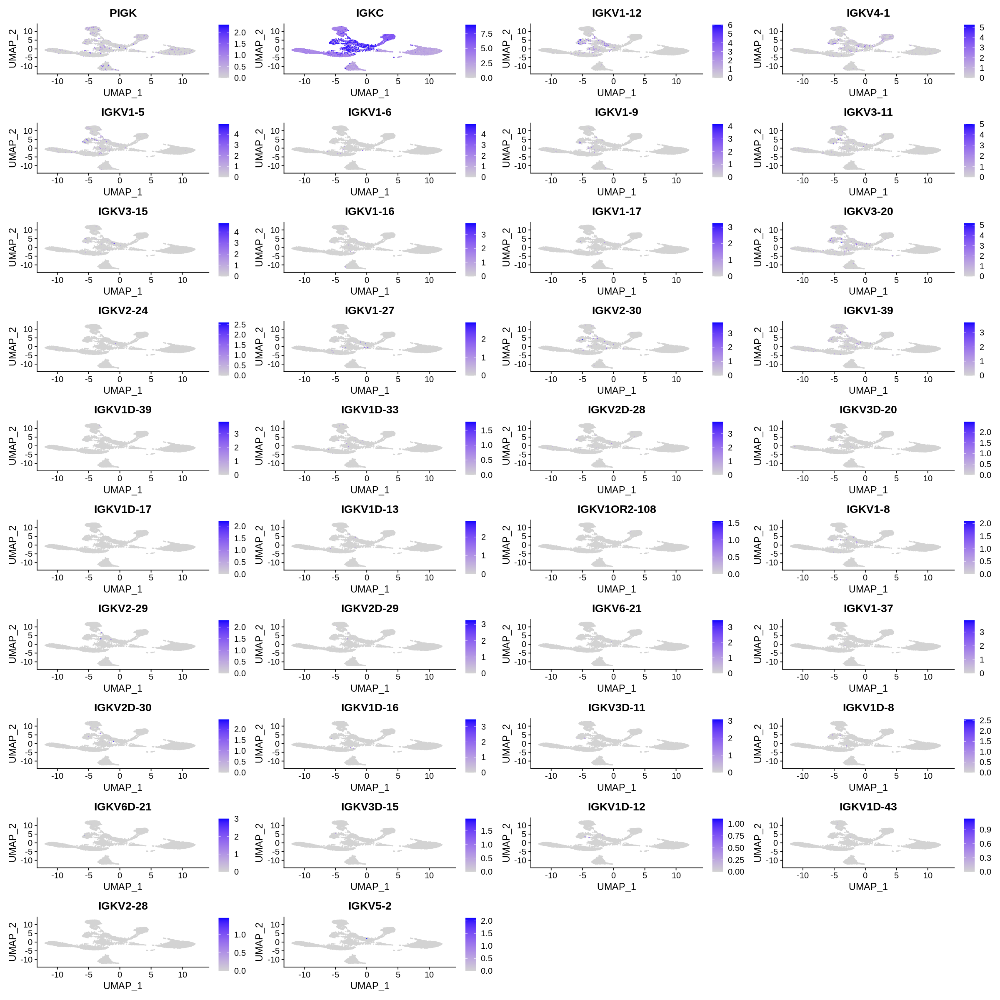

In [72]:
options(repr.plot.height=20,repr.plot.width=20)
FeaturePlot(allPC3, features = IGK,reduction="umap")

Warning message in FeaturePlot(allPC3, features = IGL, reduction = "umap"):
“All cells have the same value (0) of SIGLEC15.”
Warning message in FeaturePlot(allPC3, features = IGL, reduction = "umap"):
“All cells have the same value (0) of SIGLEC12.”
Warning message in FeaturePlot(allPC3, features = IGL, reduction = "umap"):
“All cells have the same value (0) of SIGLEC6.”
Warning message in FeaturePlot(allPC3, features = IGL, reduction = "umap"):
“All cells have the same value (0) of IGLON5.”
Warning message in FeaturePlot(allPC3, features = IGL, reduction = "umap"):
“All cells have the same value (0) of IGLJ3.”


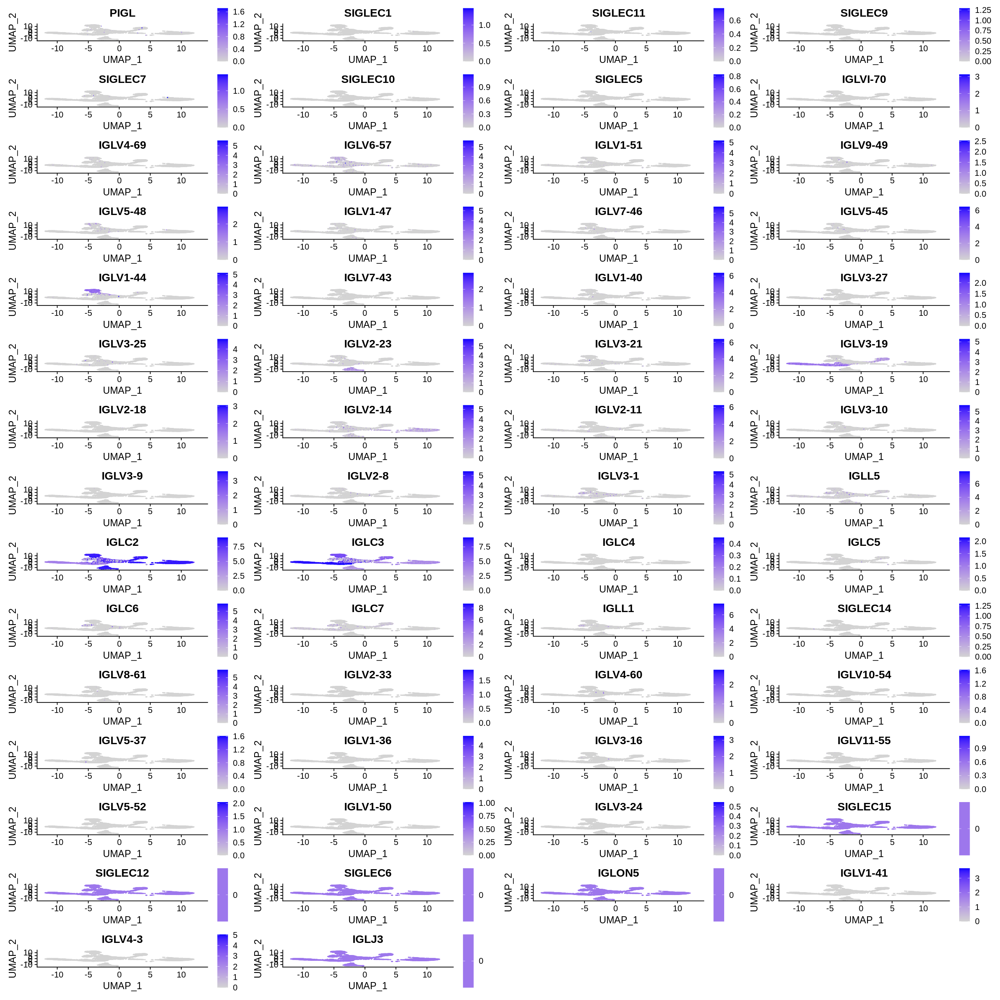

In [73]:
options(repr.plot.height=20,repr.plot.width=20)
FeaturePlot(allPC3, features = IGL,reduction="umap")

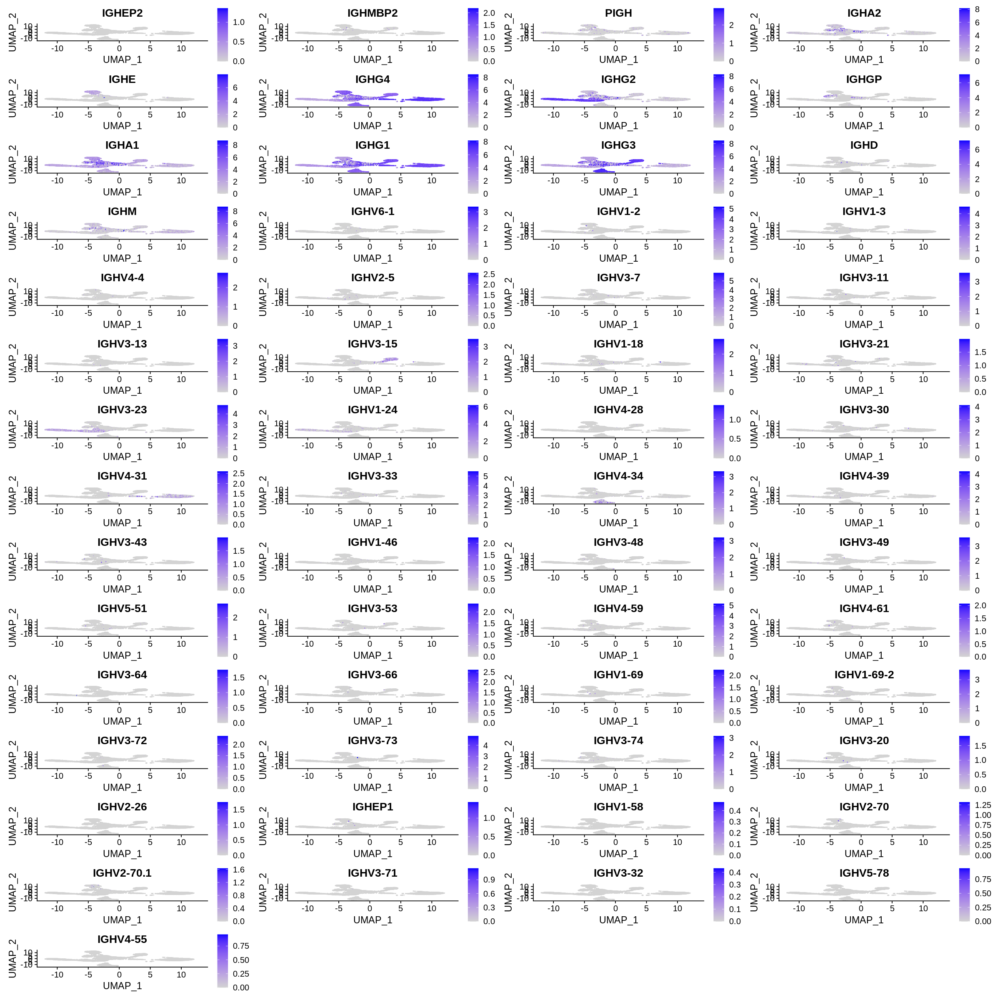

In [74]:
options(repr.plot.height=20,repr.plot.width=20)
FeaturePlot(allPC3, features = IGH,reduction="umap")

In [75]:
options(repr.plot.height=6,repr.plot.width=6)

Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.

Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.

Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.

Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.

Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.

Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.



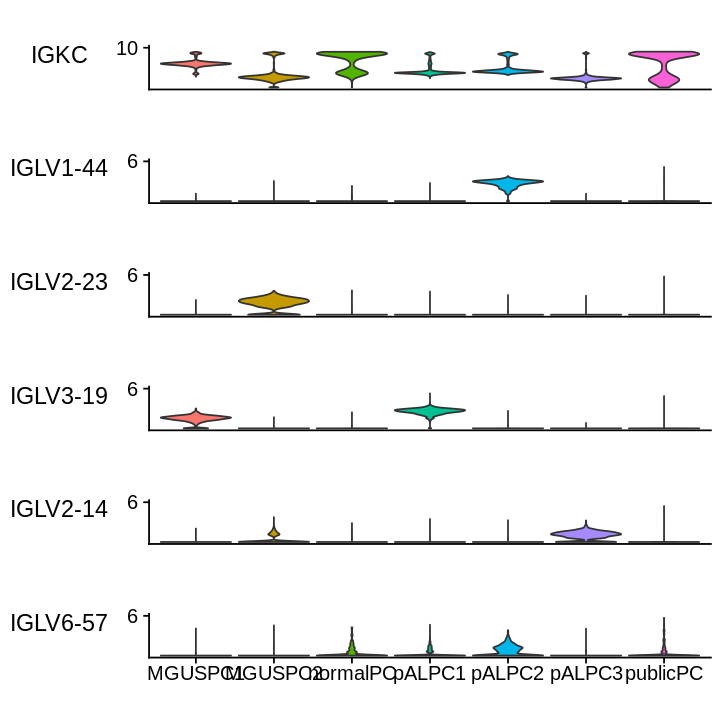

In [76]:
features<- c("IGKC","IGLV1-44","IGLV2-23","IGLV3-19","IGLV2-14",'IGLV6-57')
StackedVlnPlot(obj =allPC3, features = features,group.by="orig.ident")

In [77]:
ggsave("fig.3.20.pdf",height=6,width=6)
dev.off()

null device 
          1

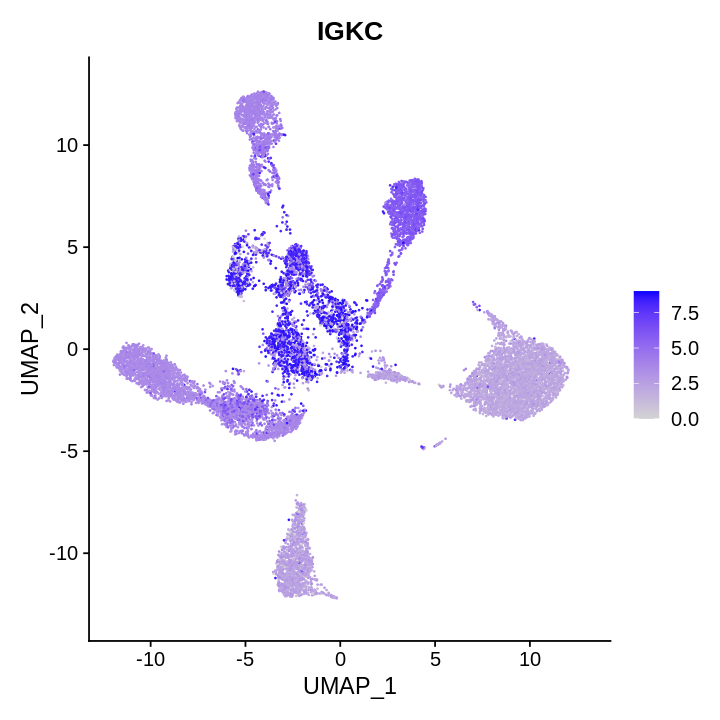

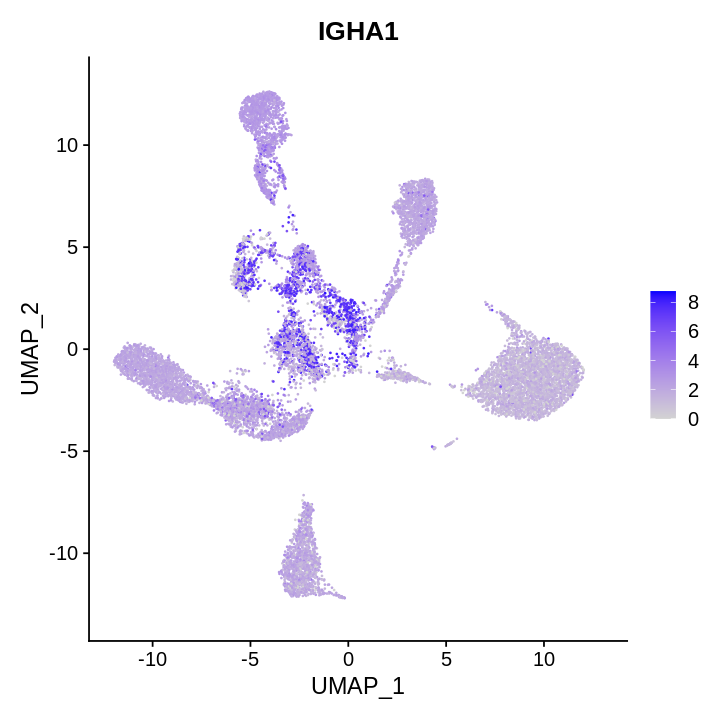

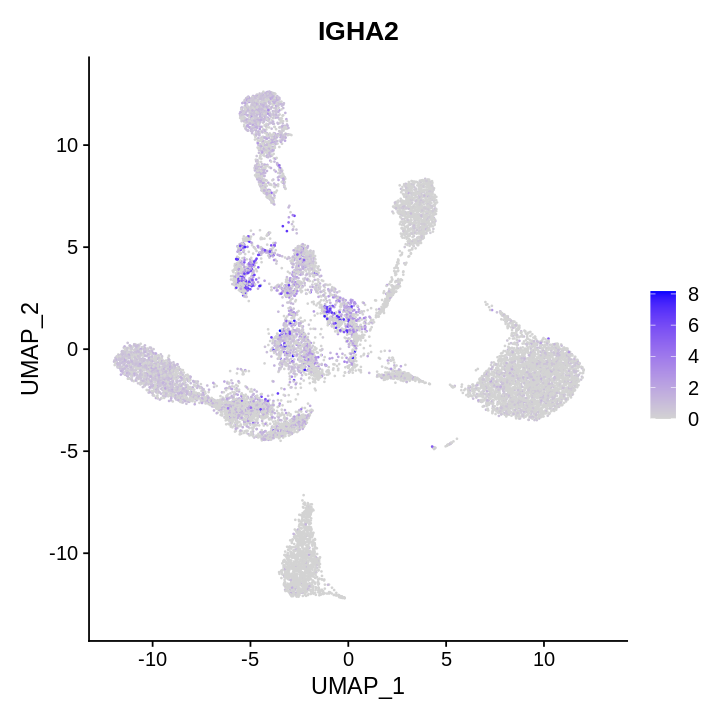

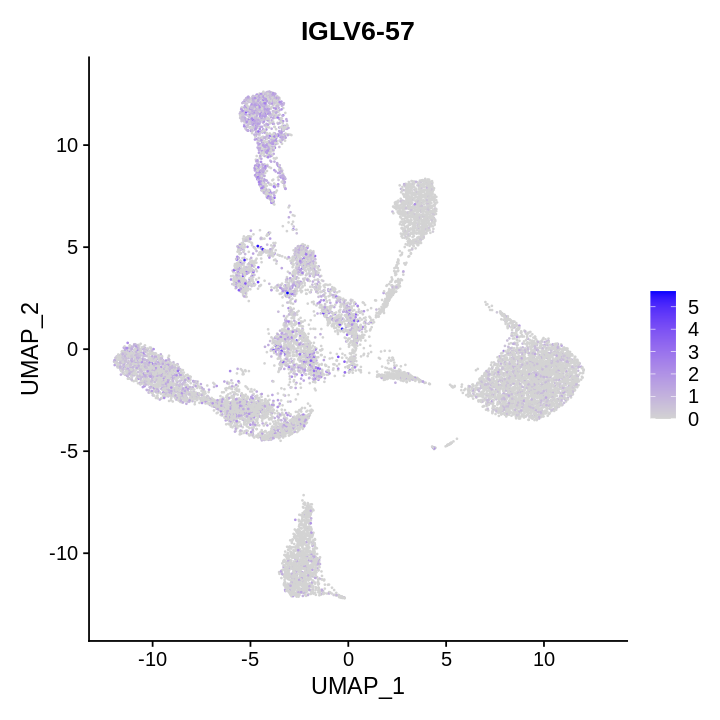

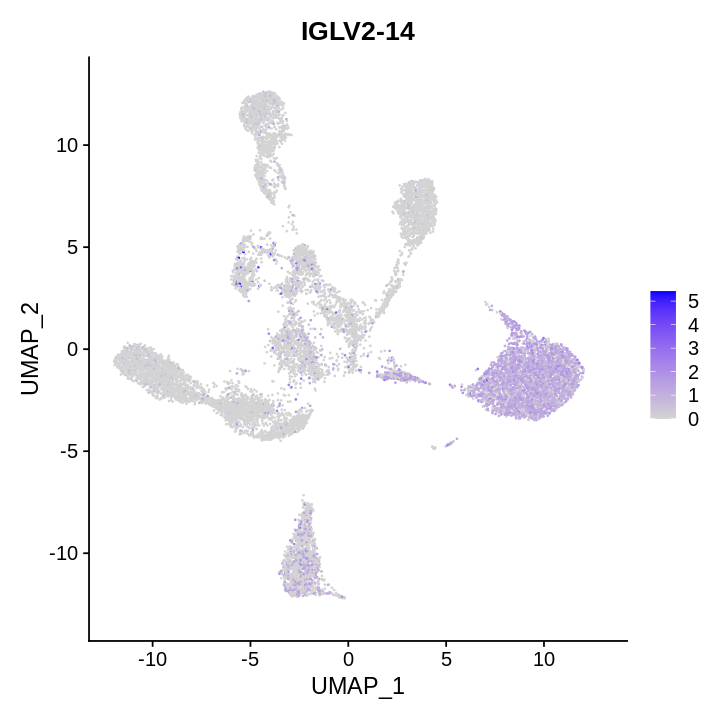

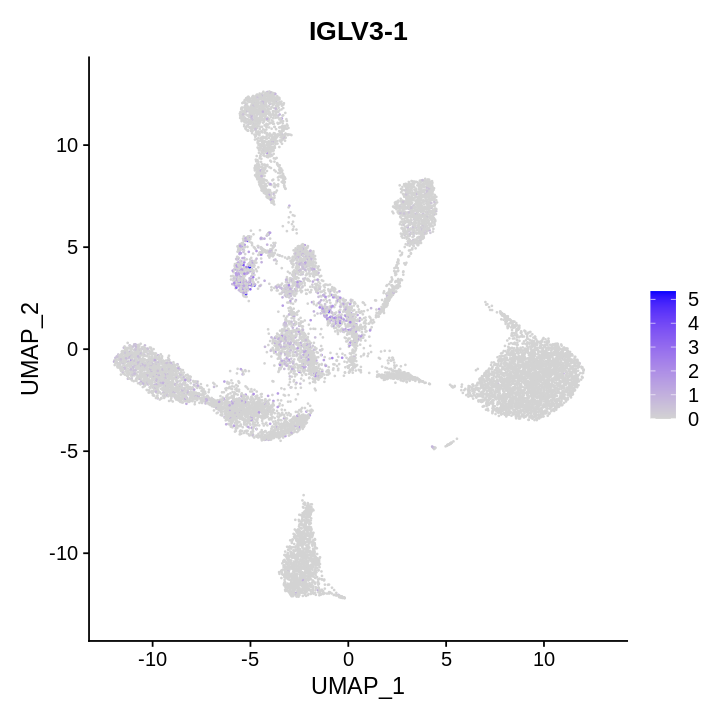

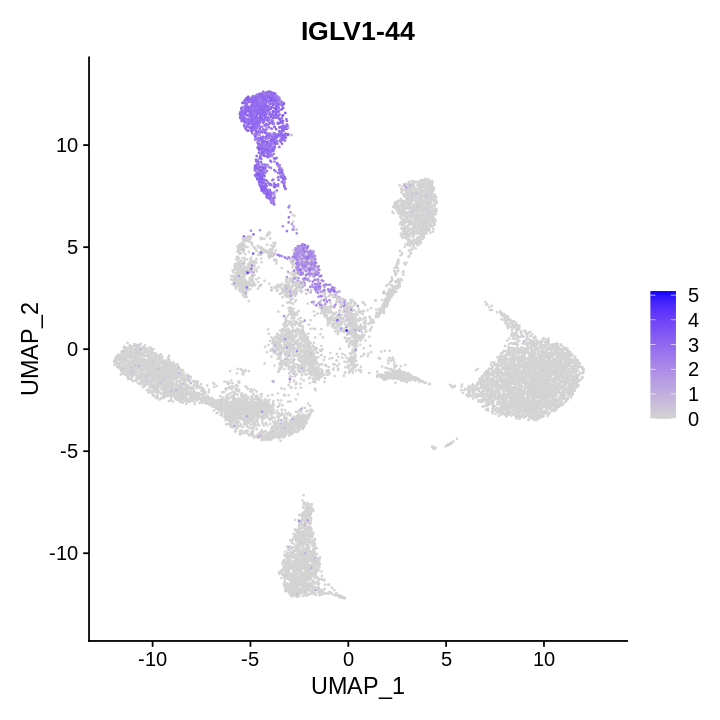

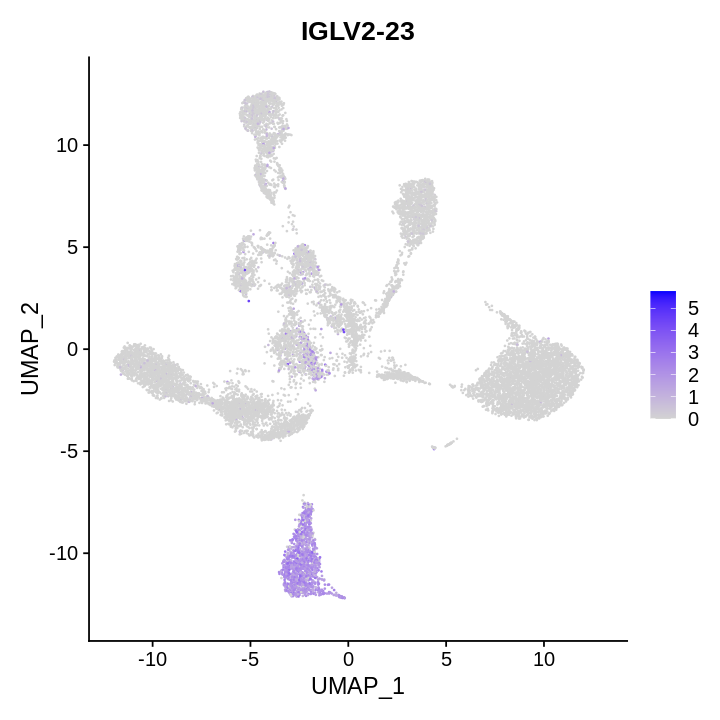

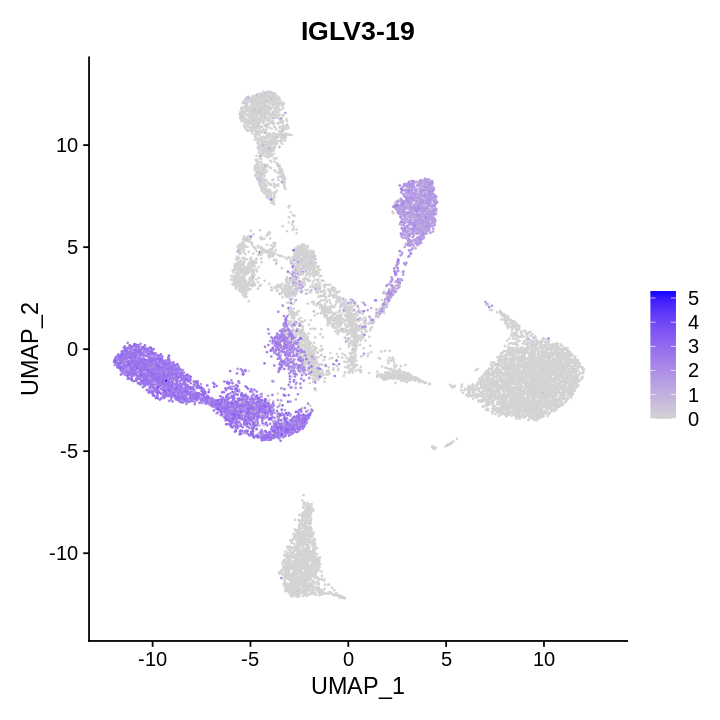

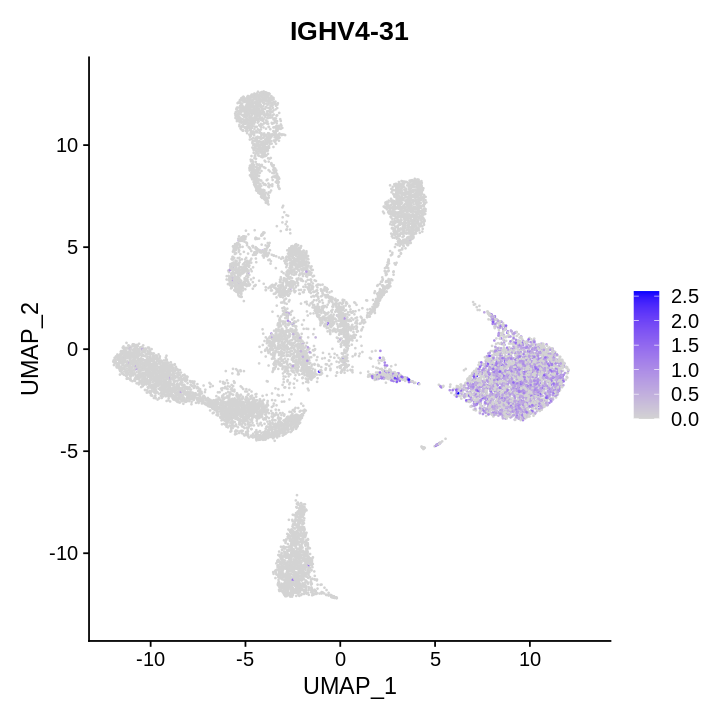

In [78]:
options(repr.plot.height=6,repr.plot.width=6)
FeaturePlot(allPC3, features ="IGKC",reduction="umap")
ggsave("fig.3.4.1.pdf",height=6,width=6)
FeaturePlot(allPC3, features ="IGHA1",reduction="umap")
FeaturePlot(allPC3, features ="IGHA2",reduction="umap")
FeaturePlot(allPC3, features ="IGLV6-57",reduction="umap")
ggsave("fig.3.4.2.pdf",height=6,width=6)
FeaturePlot(allPC3, features ="IGLV2-14",reduction="umap")
ggsave("fig.3.4.3.pdf",height=6,width=6)
FeaturePlot(allPC3, features ="IGLV3-1",reduction="umap")
FeaturePlot(allPC3, features ="IGLV1-44",reduction="umap")
ggsave("fig.3.4.4.pdf",height=6,width=6)
FeaturePlot(allPC3, features ="IGLV2-23",reduction="umap")
ggsave("fig.3.4.5.pdf",height=6,width=6)
FeaturePlot(allPC3, features ="IGLV3-19",reduction="umap")
ggsave("fig.3.4.6.pdf",height=6,width=6)
FeaturePlot(allPC3, features ="IGHV4-31",reduction="umap")

In [79]:
allPC3[["percent.igl"]] <- PercentageFeatureSet(allPC3, pattern = "^IGL")
allPC3[["percent.igh"]] <- PercentageFeatureSet(allPC3, pattern = "^IGH")
allPC3[["percent.igk"]] <- PercentageFeatureSet(allPC3, pattern = "^IGK")

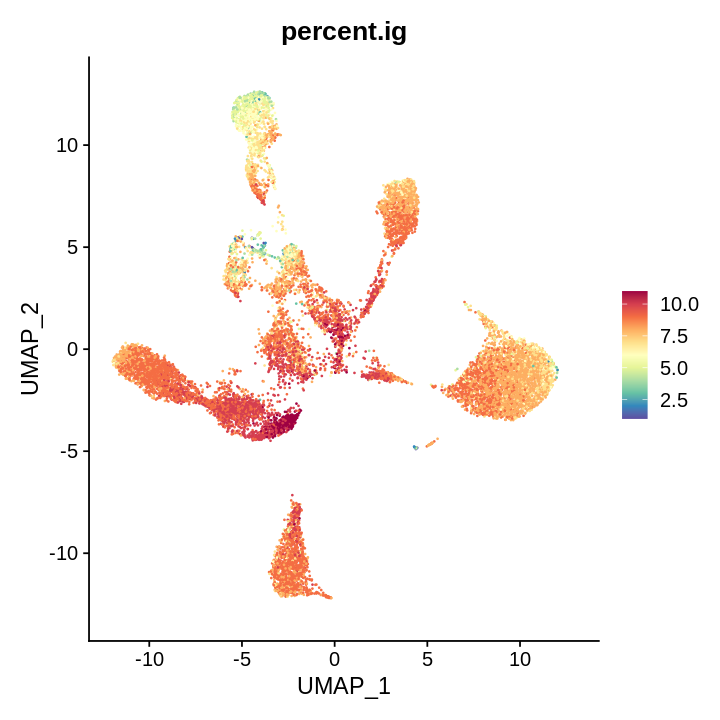

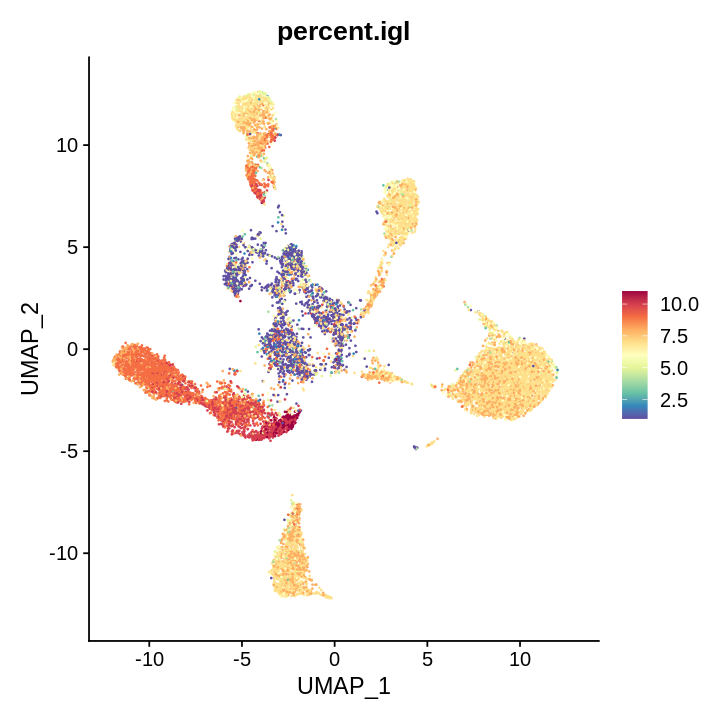

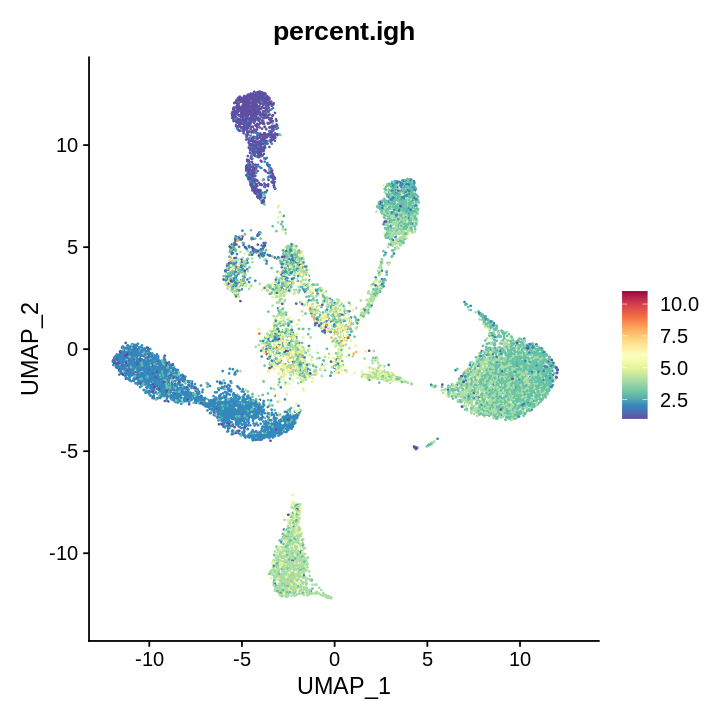

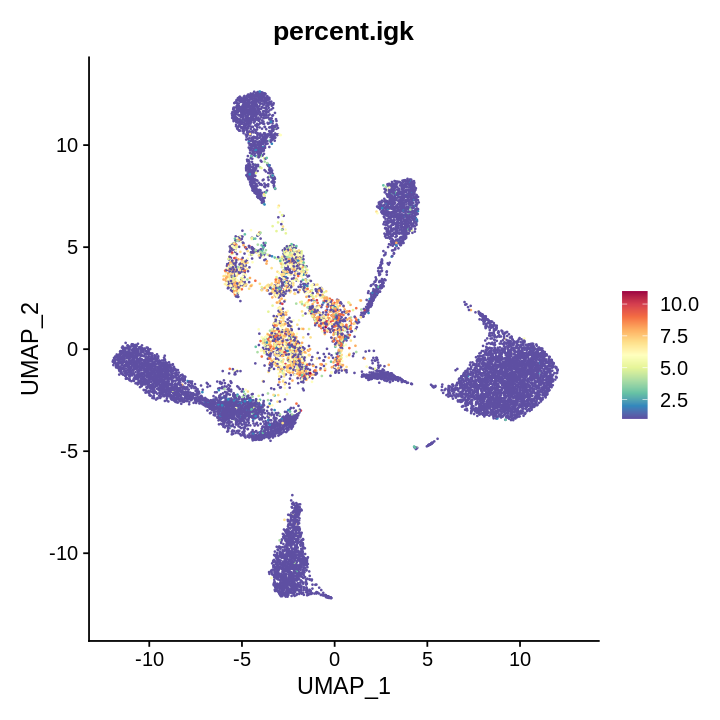

In [80]:
options(repr.plot.height=6,repr.plot.width=6)
library(RColorBrewer)
FeaturePlot(allPC3, features = c('percent.ig'),cols=rev(brewer.pal(11,'Spectral')))
ggsave("fig.3.5.1.pdf",height=6,width=6)
FeaturePlot(allPC3, features = c('percent.igl'),cols=rev(brewer.pal(11,'Spectral')))
ggsave("fig.3.5.2.pdf",height=6,width=6)
FeaturePlot(allPC3, features = c('percent.igh'),cols=rev(brewer.pal(11,'Spectral')))
ggsave("fig.3.5.3.pdf",height=6,width=6)
FeaturePlot(allPC3, features = c('percent.igk'),cols=rev(brewer.pal(11,'Spectral')))
ggsave("fig.3.5.4.pdf",height=6,width=6)

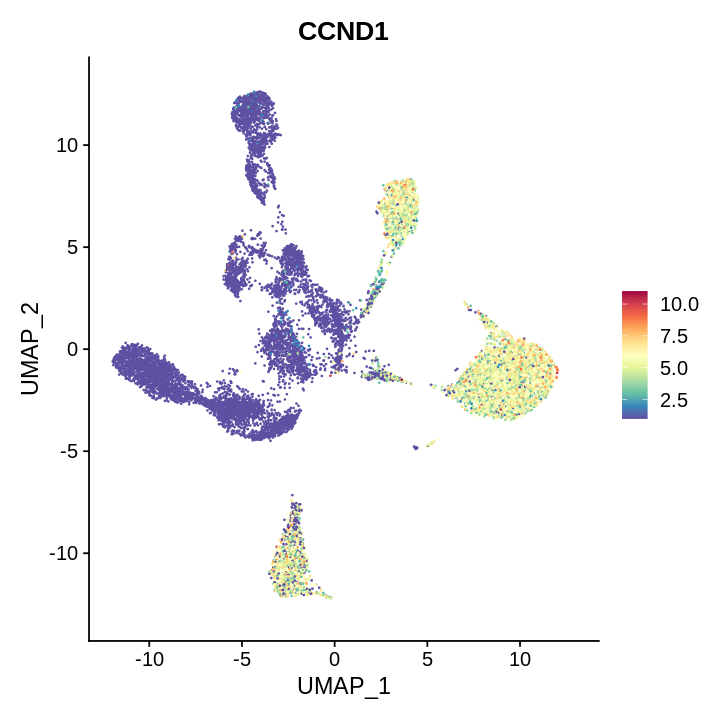

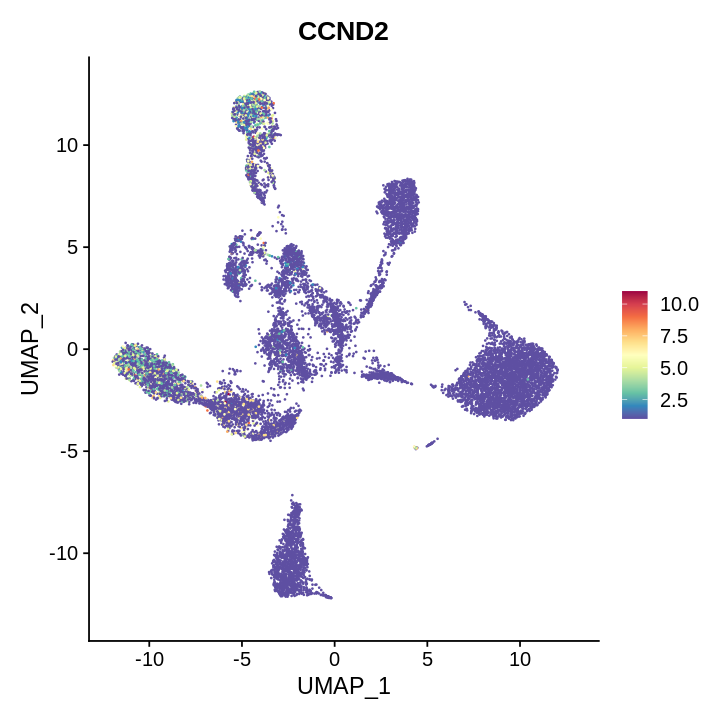

In [81]:
options(repr.plot.height=6,repr.plot.width=6)
FeaturePlot(allPC3, features = c('CCND1'),cols=rev(brewer.pal(11,'Spectral')))
ggsave("fig.3.6.1.pdf",height=6,width=6)
FeaturePlot(allPC3, features = c('CCND2'),cols=rev(brewer.pal(11,'Spectral')))
ggsave("fig.3.6.2.pdf",height=6,width=6)

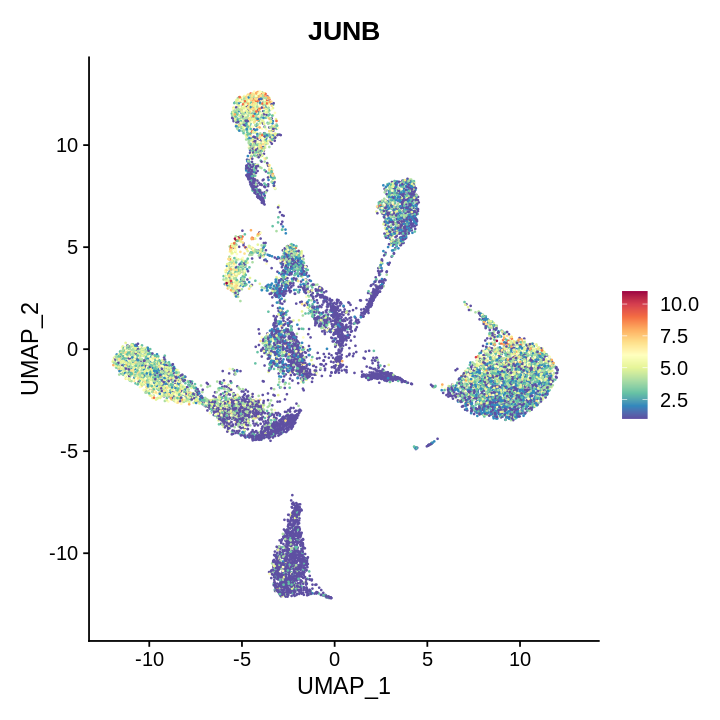

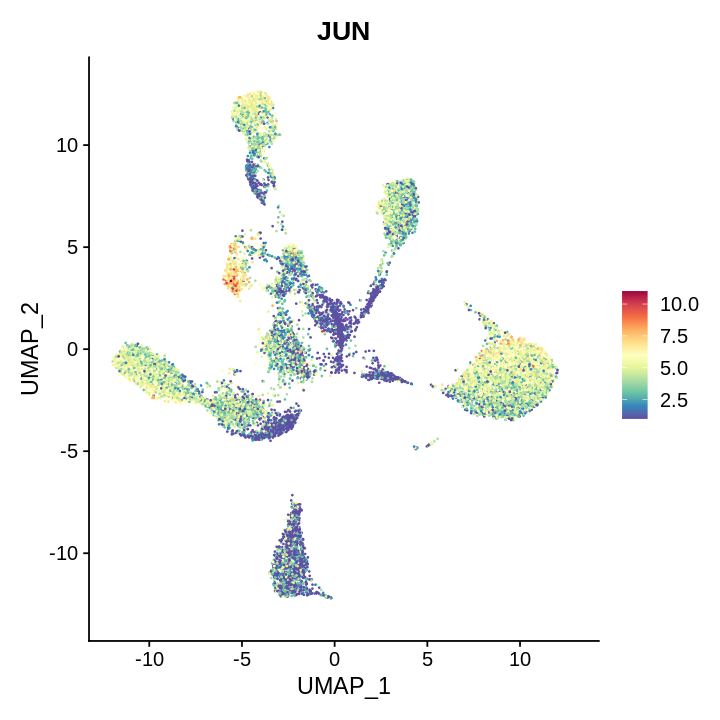

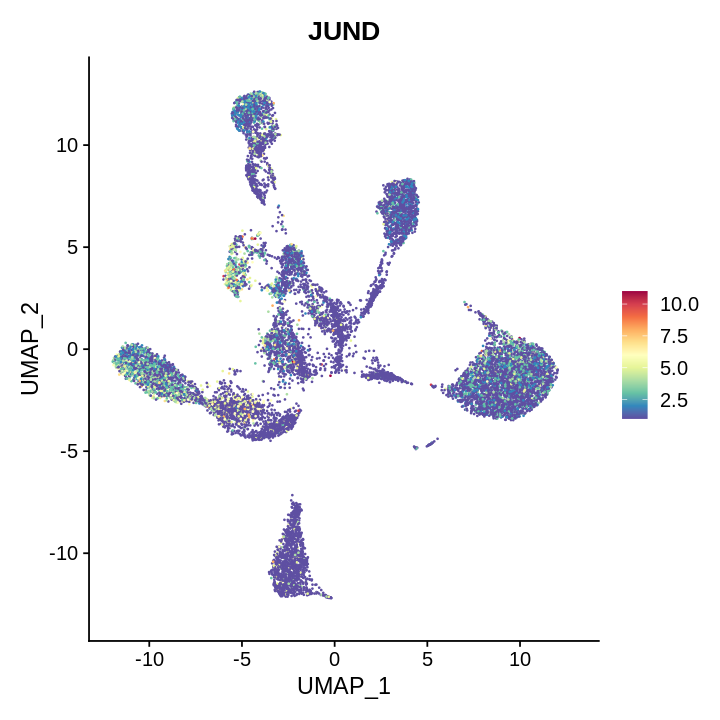

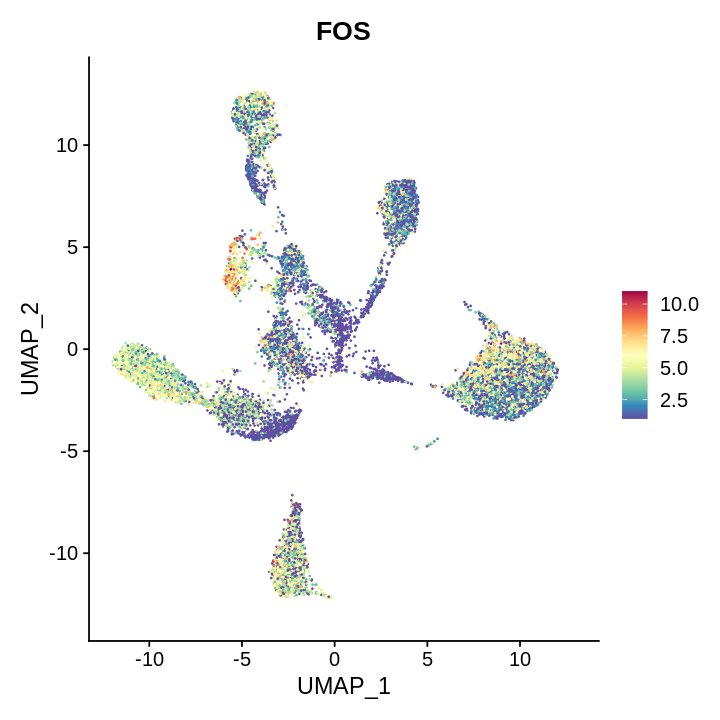

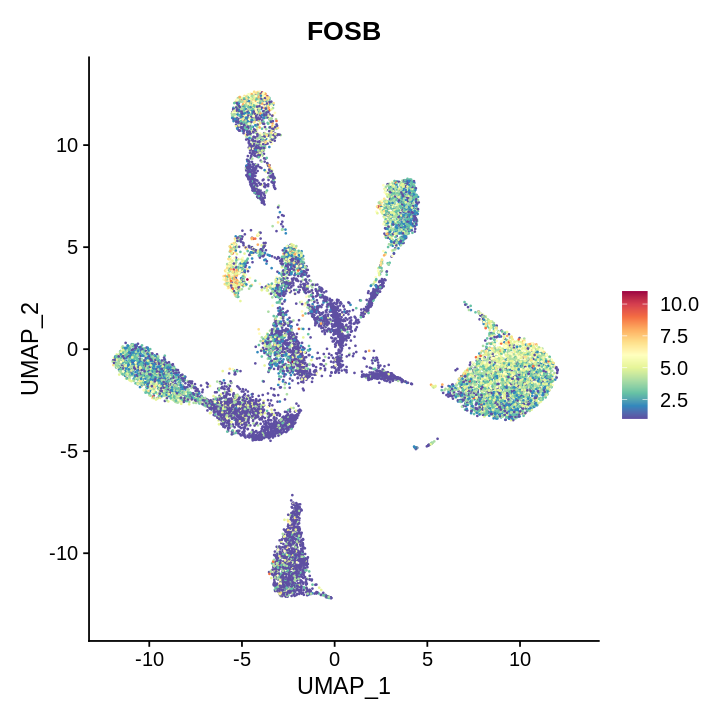

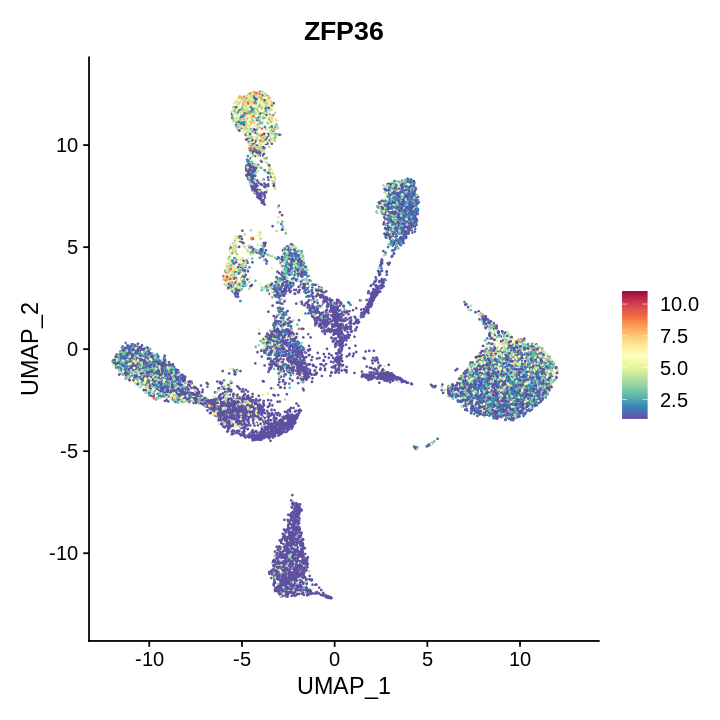

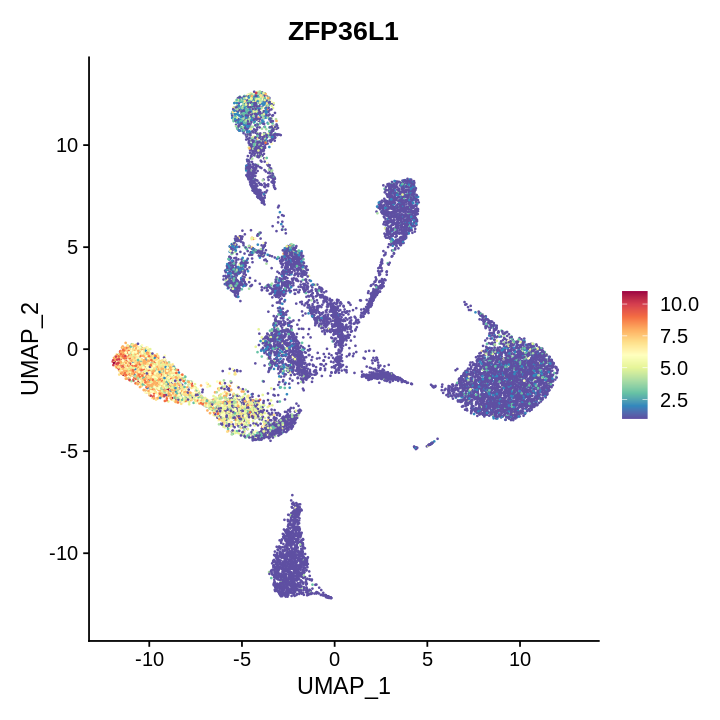

In [82]:
options(repr.plot.height=6,repr.plot.width=6)
FeaturePlot(allPC3, features = c('JUNB'),cols=rev(brewer.pal(11,'Spectral')))
FeaturePlot(allPC3, features = c('JUN'),cols=rev(brewer.pal(11,'Spectral')))
FeaturePlot(allPC3, features = c('JUND'),cols=rev(brewer.pal(11,'Spectral')))
FeaturePlot(allPC3, features = c('FOS'),cols=rev(brewer.pal(11,'Spectral')))
FeaturePlot(allPC3, features = c('FOSB'),cols=rev(brewer.pal(11,'Spectral')))
FeaturePlot(allPC3, features = c('ZFP36'),cols=rev(brewer.pal(11,'Spectral')))
FeaturePlot(allPC3, features = c('ZFP36L1'),cols=rev(brewer.pal(11,'Spectral')))

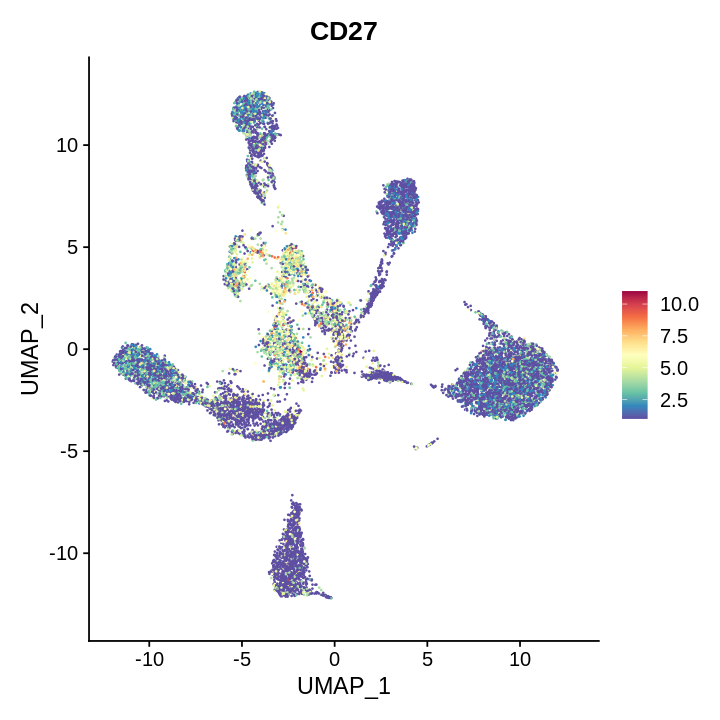

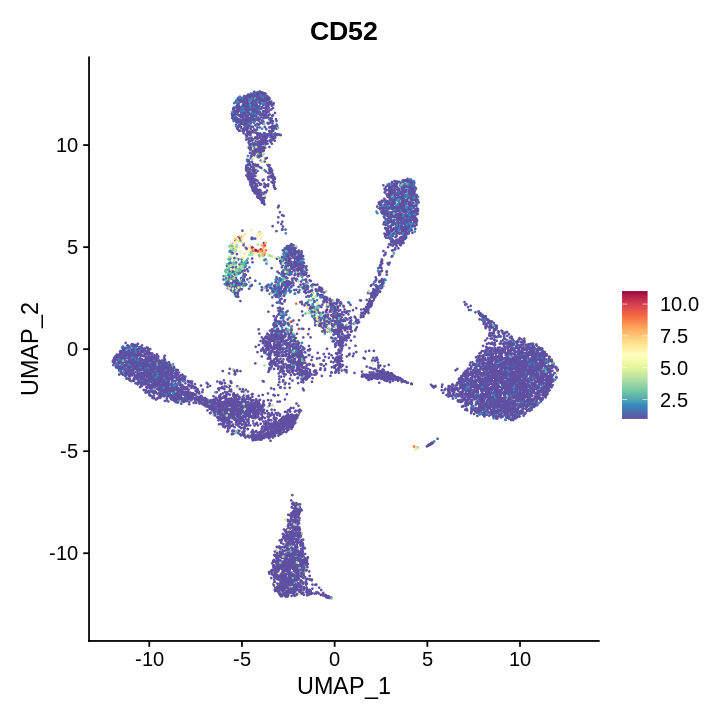

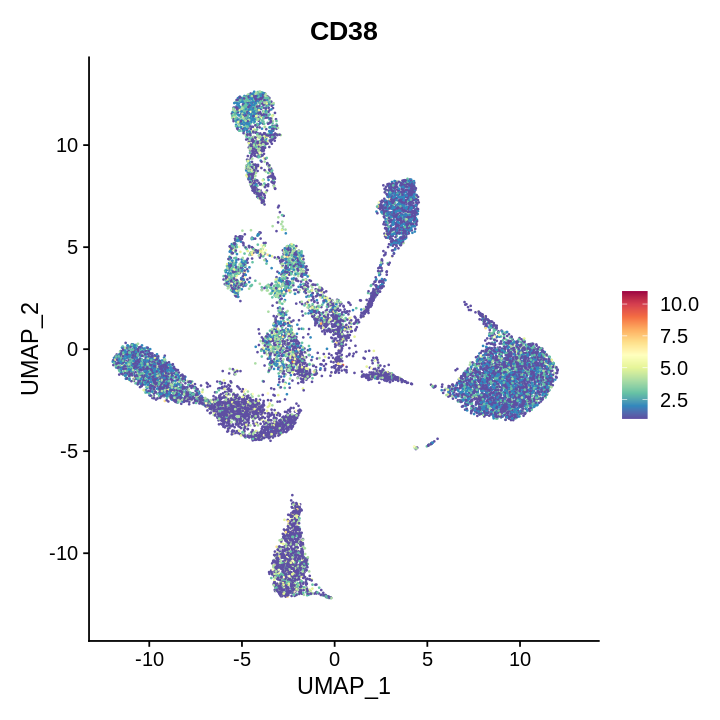

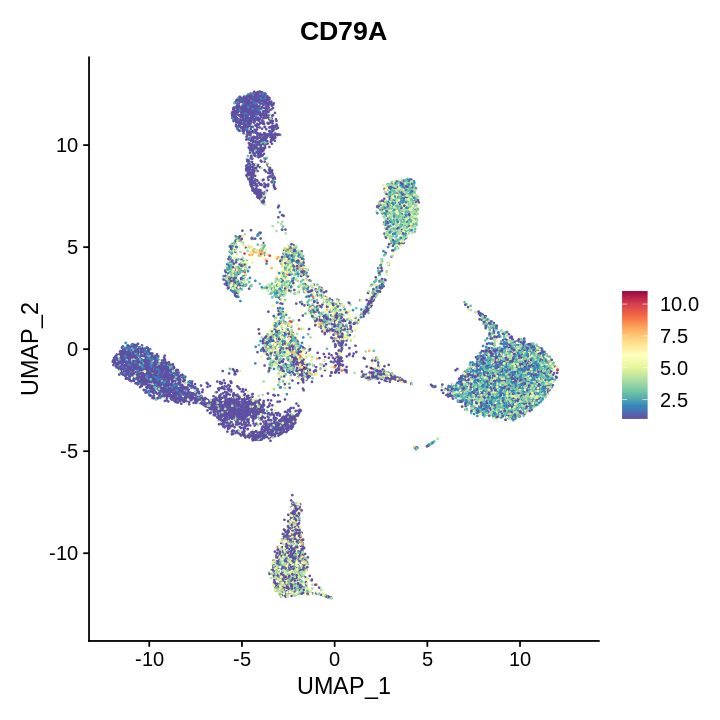

In [83]:
options(repr.plot.height=6,repr.plot.width=6)
FeaturePlot(allPC3, features = c('CD27'),cols=rev(brewer.pal(11,'Spectral')))
ggsave("fig.3.6.3.pdf",height=6,width=6)
FeaturePlot(allPC3, features = c('CD52'),cols=rev(brewer.pal(11,'Spectral')))
ggsave("fig.3.6.4.pdf",height=6,width=6)
FeaturePlot(allPC3, features = c('CD38'),cols=rev(brewer.pal(11,'Spectral')))
ggsave("fig.3.6.5.pdf",height=6,width=6)
FeaturePlot(allPC3, features = c('CD79A'),cols=rev(brewer.pal(11,'Spectral')))
ggsave("fig.3.6.6.pdf",height=6,width=6)

In [84]:
load(file="0710.MGUSAL.merge.seurat.Rda")

In [85]:
allPC3merge<-allPC3

In [86]:
load(file="0711-ob.integratve-7samples.Rda")

In [87]:
allPC3integrate<-ob.integrated

In [88]:
allPC3merge

An object of class Seurat 
20868 features across 14081 samples within 1 assay 
Active assay: RNA (20868 features, 3000 variable features)
 2 dimensional reductions calculated: pca, umap

In [89]:
allPC3integrate

An object of class Seurat 
22868 features across 14081 samples within 2 assays 
Active assay: integrated (2000 features, 2000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [90]:
metaallPC3merge<-allPC3merge@meta.data

In [91]:
metaallPC3integrate<-allPC3integrate@meta.data

In [92]:
colnames(metaallPC3integrate)

[1] "orig.ident"             "nCount_RNA"             "nFeature_RNA"          
 [4] "percent.mt"             "percent.ig"             "integrated_snn_res.0.1"
 [7] "integrated_snn_res.0.2" "integrated_snn_res.0.3" "integrated_snn_res.0.4"
[10] "integrated_snn_res.0.5" "integrated_snn_res.0.6" "integrated_snn_res.0.7"
[13] "integrated_snn_res.0.8" "integrated_snn_res.0.9" "integrated_snn_res.1"  
[16] "seurat_clusters"

In [93]:
colnames(metaallPC3merge)

[1] "orig.ident"      "nCount_RNA"      "nFeature_RNA"    "percent.mt"     
 [5] "percent.ig"      "RNA_snn_res.0.1" "RNA_snn_res.0.2" "RNA_snn_res.0.3"
 [9] "RNA_snn_res.0.4" "RNA_snn_res.0.5" "RNA_snn_res.0.6" "RNA_snn_res.0.7"
[13] "RNA_snn_res.0.8" "RNA_snn_res.0.9" "RNA_snn_res.1"   "seurat_clusters"

In [94]:
metaallPC3merge$unilabel<-paste(metaallPC3merge$orig.ident,metaallPC3merge$percent.mt,metaallPC3merge$"nCount_RNA",metaallPC3merge$"nFeature_RNA",sep="_")

In [95]:
metaallPC3integrate$unilabel<-paste(metaallPC3integrate$orig.ident,metaallPC3integrate$percent.mt,metaallPC3integrate$"nCount_RNA",metaallPC3integrate$"nFeature_RNA",sep="_")

In [96]:
rownames(metaallPC3integrate)<-metaallPC3integrate$unilabel

In [97]:
metaallPC3integrate<-metaallPC3integrate[metaallPC3merge$unilabel,]

In [98]:
allPC3merge@meta.data$mylabel<-allPC3integrate@meta.data$seurat_clusters

In [99]:
allPC3merge@meta.data

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.ig,RNA_snn_res.0.1,RNA_snn_res.0.2,RNA_snn_res.0.3,RNA_snn_res.0.4,RNA_snn_res.0.5,RNA_snn_res.0.6,RNA_snn_res.0.7,RNA_snn_res.0.8,RNA_snn_res.0.9,RNA_snn_res.1,seurat_clusters,mylabel
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
AAACCTGAGATGCGAC-1_1,MGUSPC1,7931,832,1.19334481,72.03672,6,7,3,3,3,3,3,3,3,3,3,1
AAACCTGAGGGTATCG-1_1,MGUSPC1,17090,1769,0.60096154,65.82714,6,7,3,3,3,3,3,3,3,3,3,0
AAACCTGAGTCTTGCA-1_1,MGUSPC1,7026,441,0.23303633,82.74160,5,6,6,6,6,13,13,13,14,15,13,0
AAACGGGAGGTGCACA-1_1,MGUSPC1,10283,727,0.01785236,77.72025,5,6,6,6,6,7,7,8,9,8,7,0
AAACGGGGTAAGGATT-1_1,MGUSPC1,9876,616,0.99713693,81.25185,5,6,6,6,6,13,13,13,14,15,13,0
AAACGGGGTGCAGTAG-1_1,MGUSPC1,16171,1394,1.07445696,75.76374,6,7,3,3,3,3,3,3,3,3,3,3
AAACGGGTCCAGATCA-1_1,MGUSPC1,1736,185,1.05849582,82.11699,5,6,6,6,6,13,13,13,14,15,13,2
AAACGGGTCTAACGGT-1_1,MGUSPC1,17402,1676,0.62338211,70.29954,6,7,3,3,3,3,3,3,3,3,3,0
AAAGATGCATGAGCGA-1_1,MGUSPC1,4096,429,0.11394713,77.05105,5,6,6,6,6,13,13,13,14,15,13,3


In [100]:
options(repr.plot.height=8,repr.plot.width=8)

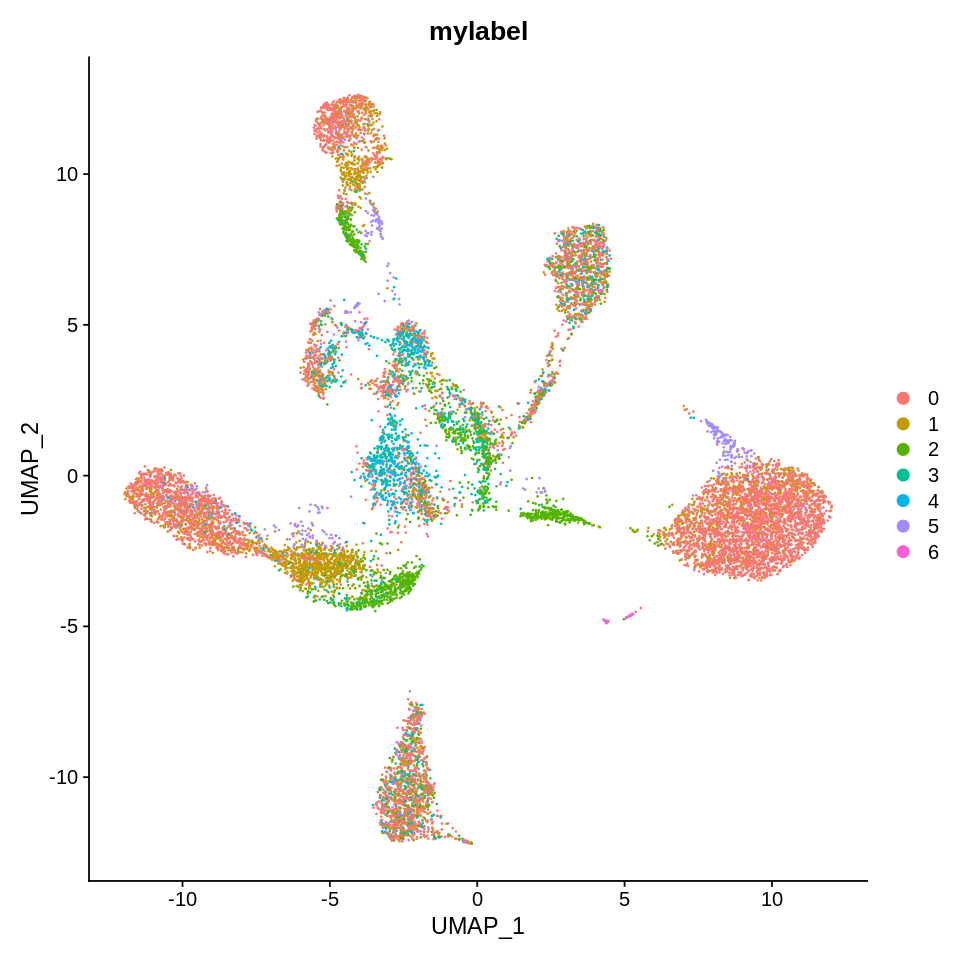

In [101]:
DimPlot(allPC3merge, reduction = "umap",group.by="mylabel",label=F)

In [102]:
ggsave("fig.3.2.pdf",height=8,width=8)
dev.off()

null device 
          1

In [103]:
options(repr.plot.height=5,repr.plot.width=20)

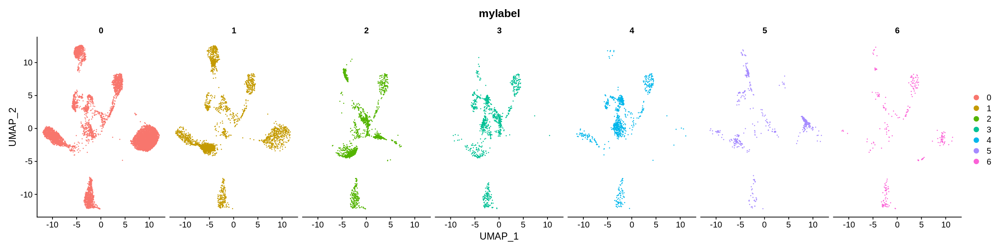

In [104]:
DimPlot(allPC3merge, reduction = "umap",split.by="mylabel",group.by='mylabel')

In [105]:
ggsave("fig.s3.1.pdf",height=4,width=20)
dev.off()

null device 
          1

In [113]:
allPC43d <- RunUMAP(allPC3merge, dims = 1:12,n.components=3L)

17:43:07 UMAP embedding parameters a = 0.9922 b = 1.112

17:43:07 Read 14081 rows and found 12 numeric columns

17:43:07 Using Annoy for neighbor search, n_neighbors = 30

17:43:07 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

17:43:08 Writing NN index file to temp file /tmp/RtmptKqRcD/filea255c1c81f629

17:43:08 Searching Annoy index using 1 thread, search_k = 3000

17:43:12 Annoy recall = 100%

17:43:12 Commencing smooth kNN distance calibration using 1 thread

17:43:13 Initializing from normalized Laplacian + noise

17:43:13 Commencing optimization for 200 epochs, with 605324 positive edges

17:43:19 Optimization finished



In [114]:
# Prepare a dataframe for cell plotting
plot.data <- FetchData(object = allPC43d, vars = c("UMAP_1", "UMAP_2", "UMAP_3", "mylabel"))

# Make a column of row name identities (these will be your cell/barcode names)
plot.data$label <- paste(rownames(plot.data))


In [117]:
library("scales")
p<-plot_ly(data = plot.data, 
        x = ~UMAP_1, y = ~UMAP_2, z = ~UMAP_3, 
        color = ~mylabel, 
           colors=hue_pal()(14),
        type = "scatter3d", 
        mode = "markers", 
        marker = list(size = 3, width=2), # controls size of points
        hoverinfo="text") #When you visualize your plotly object, hovering your mouse pointer over a point shows cell names

In [118]:
library(htmlwidgets)
saveWidget(p, "1004.merge.html", selfcontained = F, libdir = "libmerge")

In [119]:
save(allPC3merge,file="0710.MGUSAL.merge.seurat.Rda")